# RTcotomy ML

## Load Python Packages

In [373]:
import numpy as np
import pandas as pd
import glob
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, roc_curve, auc, precision_recall_curve
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib as mpl
from itertools import combinations
from collections import defaultdict
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import mean_squared_error
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.ensemble import GradientBoostingClassifier
import xgboost as xgb
from sklearn.model_selection import GridSearchCV

## Define data filepaths, codes, dictionaries and common columns

In [269]:
data_fp = '/Users/JakeCanfield/Documents/Trauma_Surgery_Research/Data/Raw_data/PUF AY %i/CSV/'
years = range(2017, 2023)
thoracotomy_codes = ['0WJB0ZZ', '0WJ90ZZ', '02JA0ZZ', '02JY0ZZ', '0BJL0ZZ', '0BJK0ZZ', '0BJQ0ZZ','0WJ80ZZ', '0WJC0ZZ', '0WJD0ZZ', '02VW0CZ', '02QA0ZZ', '3E080GC']
sternotomy_codes = ['0P800ZZ']

mechanism_code_dict = {1:'Cut/pierce', 2:'Drowning/submersion', 3:'Fall', 4:'Fire/flame', 5:'Hot object/substance', 6:'Firearm', 7:'Machinery', 8:'MVT Occupant', 9:'MVT Motorcyclist', 10:'MVT Pedal cyclist', 11:'MVT Pedestrian', 12:'MVT Unspecified', 13:'MVT Other', 14:'Pedal cyclist, other', 15:'Pedestrian, other', 16:'Transport, other', 17:'Natural/environmental,  Bites and stings', 18:'Natural/environmental,  Other', 19:'Overexertion', 20:'Poisoning', 21:'Struck by, against', 22:'Suffocation', 23:'Other specified and classifiable', 24:'Other specified, not elsewhere classifiable', 25:'Unspecified', 26:'Adverse effects, medical care', 27:'Adverse effects, drugs'} # As noted in PUF dictionary
trauma_type_code_dict = {1:'Blunt', 2:'Penetrating', 3:'Burn', 4:'Other/unspecified', 9:'Activity Code - Not Valid as a Primary E-Code'} # As noted in PUF Dictionary
sex_code_dict = {1:'Male', 2:'Female', 3:'Unknown'}
eddischarge_code_dict = {1: 'Floor bed (general admission, non-specialty unit bed)', 2: 'Observation unit (unit that provides < 24 hour stays)', 3: 'Telemetry/step-down unit (less acuity than ICU)', 4: 'Home with services', 5: 'Deceased/expired', 6: 'Other (jail, institutional care, mental health, etc.)', 7: 'Operating Room', 8: 'Intensive Care Unit (ICU)', 9: 'Home without services', 10: 'Left against medical advice', 11: 'Transferred to another hospital'}
hospdischarge_disposition_code_dict = {1: 'Discharged/Transferred to a short-term general hospital for inpatient care', 2: 'Discharged/Transferred to an Intermediate Care Facility (ICF)', 3: 'Discharged/Transferred to home under care of organized home health service', 4: 'Left against medical advice or discontinued care', 5: 'Deceased/Expired', 6: 'Discharged to home or self-care (routine discharge)', 7: 'Discharged/Transferred to Skilled Nursing Facility (SNF)', 8: 'Discharged/Transferred to hospice care', 10: 'Discharged/Transferred to court/law enforcement', 11: 'Discharged/Transferred to inpatient rehab or designated unit', 12: 'Discharged/Transferred to Long Term Care Hospital (LTCH)', 13: 'Discharged/Transferred to a psychiatric hospital or psychiatric distinct part unit of a hospital', 14: 'Discharged/Transferred to another type of institution not defined elsewhere'}
deathined_code_dict = {1:'Arrived with NO signs of life', 2:'Arrived with signs of life'}
prehospca_code_dict = {1:'Yes', 2:'No'}
transport_mode_code_dict = {1:'Ground Ambulance', 2:'Helicopter Ambulance', 3:'Fixed-wing Ambulance', 4:'Private/Public Vehicle/Walk-in', 5:'Police', 6:'Other'}

cols17 = pd.read_csv(data_fp%(2017)+'PUF_TRAUMA.csv', nrows=1).columns.tolist()
cols19 = pd.read_csv(data_fp%(2017)+'PUF_TRAUMA.csv', nrows=1).columns.tolist()
cols17 = [x.upper() for x in cols17]
cols19 = [x.upper() for x in cols19]

common_cols = list(set(cols17) & set(cols19))

## Load in data and format by year to create data files for use

In [270]:
for year in years:
    
    if year in range(2017, 2019):
        TRAUMA_df = pd.read_csv(data_fp%year + 'PUF_TRAUMA.csv')
        ICDPROCEDURE_df = pd.read_csv(data_fp%year + 'PUF_ICDPROCEDURE.csv')
        ICDPROCEDURE_LOOKUP_df = pd.read_csv(data_fp%year + 'PUF_ICDPROCEDURE_LOOKUP.csv')
        ECODE_LOOKUP_df = pd.read_csv(data_fp%year + 'PUF_ECODE_LOOKUP.csv')
    elif year in range(2019, 2023):
        TRAUMA_df = pd.read_csv(data_fp%year + 'PUF_TRAUMA.csv')
        ICDPROCEDURE_df = pd.read_csv(data_fp%year + 'PUF_ICDPROCEDURE.csv')
        ICDPROCEDURE_LOOKUP_df = pd.read_csv(data_fp%year + 'PUF_ICDPROCEDURE_LOOKUP.csv')
        ECODE_LOOKUP_df = pd.read_csv(data_fp%year + 'PUF_ECODE_LOOKUP.csv')
    else:
        pass
    
    TRAUMA_df.columns = map(str.upper, TRAUMA_df.columns)
    ICDPROCEDURE_df.columns = map(str.upper, ICDPROCEDURE_df.columns)
    ICDPROCEDURE_LOOKUP_df.columns = map(str.upper, ICDPROCEDURE_LOOKUP_df.columns)
    ECODE_LOOKUP_df.columns = map(str.upper, ECODE_LOOKUP_df.columns)
    
    if year in range(2019, 2023):
        ICDPROCEDURE_df['PROCEDUREMINS'] = ICDPROCEDURE_df['HOSPITALPROCEDURESTARTHRS']*60
        ICDPROCEDURE_df['PROCEDUREDAYS'] = ICDPROCEDURE_df['HOSPITALPROCEDURESTARTDAYS']
        TRAUMA_df['HMRRHGCTRLSURGMINS'] = TRAUMA_df['HMRRHGCTRLSURGHRS']*60
    else:
        pass
    
    ICDPROCEDURE_df = ICDPROCEDURE_df.loc[:, ['INC_KEY', 'ICDPROCEDURECODE', 'PROCEDUREMINS', 'PROCEDUREDAYS']]
    
    ECODE_LOOKUP_df = ECODE_LOOKUP_df.loc[:, ['ECODE', 'ECODE_DESC', 'MECHANISM', 'TRAUMATYPE']]
    
    trauma_cols = np.unique(['INC_KEY', 'PRIMARYECODEICD10', 'AGEYEARS', 'SEX', 'EDDISCHARGEDISPOSITION', 'HOSPDISCHARGEDISPOSITION', 'HMRRHGCTRLSURGMINS'] + common_cols)
    TRAUMA_df = TRAUMA_df.loc[:, trauma_cols]
    TRAUMA_df = TRAUMA_df.loc[TRAUMA_df['HMRRHGCTRLSURGTYPE'] == 3.0]
    
    ICDPROCEDURE_df = ICDPROCEDURE_df.loc[ICDPROCEDURE_df['INC_KEY'].isin(np.unique(TRAUMA_df['INC_KEY']))]
    
    ICDPROCEDURE_LOOKUP_df = ICDPROCEDURE_LOOKUP_df.loc[:, ['ICDPROCEDURECODE', 'ICDPROCEDURECODE_DESC']]
    ECODE_LOOKUP_df = ECODE_LOOKUP_df.loc[:, ['ECODE', 'ECODE_DESC', 'MECHANISM', 'TRAUMATYPE']]
    
    ecode_dict = dict(zip(ECODE_LOOKUP_df['ECODE'], ECODE_LOOKUP_df['ECODE_DESC'])) # create dictionary
    TRAUMA_df['PRIMARYECODEICD10'] = TRAUMA_df['PRIMARYECODEICD10'].replace(ecode_dict) # implement dictionary
    
    mechanism_dict = dict(zip(ECODE_LOOKUP_df['ECODE_DESC'], ECODE_LOOKUP_df['MECHANISM'])) # create dictionary
    TRAUMA_df['MECHANISM'] = TRAUMA_df['PRIMARYECODEICD10'].map(mechanism_dict) # implement dictionary
    
    traumatype_dict = dict(zip(ECODE_LOOKUP_df['ECODE_DESC'], ECODE_LOOKUP_df['TRAUMATYPE'])) # create dictionary
    TRAUMA_df['TRAUMATYPE'] = TRAUMA_df['PRIMARYECODEICD10'].map(traumatype_dict) # implement dictionary
    
    trauma_cols = np.unique(['INC_KEY', 'PRIMARYECODEICD10', 'AGEYEARS', 'SEX', 'EDDISCHARGEDISPOSITION', 'HOSPDISCHARGEDISPOSITION', 'TRAUMATYPE', 'MECHANISM'] + common_cols)
    TRAUMA_df = TRAUMA_df.loc[:, trauma_cols]
    TRAUMA_df = TRAUMA_df.loc[TRAUMA_df['INC_KEY'].isin(np.unique(ICDPROCEDURE_df['INC_KEY']))]
    
    TRAUMA_df.to_csv('/Users/JakeCanfield/Documents/Trauma_Surgery_Research/data/Combined_data/MLTRAUMA_df_%i.csv'%year, index=False)
    ICDPROCEDURE_df.to_csv('/Users/JakeCanfield/Documents/Trauma_Surgery_Research/data/Combined_data/MLICDPROCEDURE_df_%i.csv'%year, index=False)
    
    display(ICDPROCEDURE_df.head())
    display(TRAUMA_df.head())
    
    # Free up memory
    del TRAUMA_df, ICDPROCEDURE_df, ICDPROCEDURE_LOOKUP_df, ECODE_LOOKUP_df

,INC_KEY,ICDPROCEDURECODE,PROCEDUREMINS,PROCEDUREDAYS
1050,170002937445,0BH17EZ,8.0,1.0
4010,170000021215,0W9930Z,NaN,NaN
4011,170000021215,0W9B30Z,NaN,NaN
4012,170000021215,0Y950ZZ,NaN,NaN
4013,170000021215,5A1221Z,NaN,NaN


,ABUSEINVESTIGATION,ABUSEINVESTIGATION_BIU,ABUSEREPORT,ABUSEREPORT_BIU,ADDITIONALECODEICD10,ADDITIONALECODEICD10_BIU,AGEYEARS,AIRBAG_DEPLOYED_FRNT,AIRBAG_DEPLOYED_NA,AIRBAG_DEPLOYED_OTHER,...,WEIGHT,WEIGHT_BIU,WHITE,WITHDRAWALLST,WITHDRAWALLSTDAYS,WITHDRAWALLSTMINS,WITHDRAWALLST_BIU,WORKRELATED,WORKRELATED_BIU,YODISCH
251,NaN,1.0,2.0,NaN,NaN,1.0,33.0,0,0,0,...,103.0,NaN,0,2.0,NaN,NaN,NaN,2.0,NaN,2017.0
835,NaN,1.0,2.0,NaN,NaN,1.0,24.0,0,1,0,...,91.0,NaN,0,2.0,NaN,NaN,NaN,2.0,NaN,2017.0
1412,NaN,1.0,2.0,NaN,NaN,1.0,31.0,0,1,0,...,59.0,NaN,0,2.0,NaN,NaN,NaN,2.0,NaN,2017.0
1489,NaN,1.0,2.0,NaN,W74.XXXA,NaN,24.0,0,1,0,...,70.0,NaN,0,NaN,NaN,NaN,2.0,2.0,NaN,2017.0
1825,NaN,1.0,2.0,NaN,NaN,1.0,24.0,0,1,0,...,100.0,NaN,0,2.0,NaN,NaN,NaN,2.0,NaN,2017.0


,INC_KEY,ICDPROCEDURECODE,PROCEDUREMINS,PROCEDUREDAYS
2363,180023610118,BW40ZZZ,0.0,1.0
2364,180023610118,0BH17EZ,6.0,1.0
2366,180023610118,0W9930Z,10.0,1.0
2367,180023610118,0WJ90ZZ,29.0,1.0
2368,180023610118,02QA0ZZ,29.0,1.0


,ABUSEINVESTIGATION,ABUSEINVESTIGATION_BIU,ABUSEREPORT,ABUSEREPORT_BIU,ADDITIONALECODEICD10,ADDITIONALECODEICD10_BIU,AGEYEARS,AIRBAG_DEPLOYED_FRNT,AIRBAG_DEPLOYED_NA,AIRBAG_DEPLOYED_OTHER,...,WEIGHT,WEIGHT_BIU,WHITE,WITHDRAWALLST,WITHDRAWALLSTDAYS,WITHDRAWALLSTMINS,WITHDRAWALLST_BIU,WORKRELATED,WORKRELATED_BIU,YODISCH
301,NaN,1.0,2.0,NaN,NaN,1.0,20.0,0,1,0,...,123.0,NaN,1,2.0,NaN,NaN,NaN,2.0,NaN,2018.0
1819,NaN,1.0,2.0,NaN,Y07.04,NaN,27.0,0,1,0,...,86.0,NaN,0,2.0,NaN,NaN,NaN,2.0,NaN,2018.0
2118,NaN,1.0,2.0,NaN,NaN,1.0,35.0,0,1,0,...,NaN,2.0,0,2.0,NaN,NaN,NaN,2.0,NaN,2018.0
3020,NaN,1.0,2.0,NaN,NaN,1.0,22.0,0,1,0,...,73.0,NaN,1,2.0,NaN,NaN,NaN,2.0,NaN,NaN
3257,NaN,1.0,2.0,NaN,NaN,1.0,71.0,0,1,0,...,NaN,2.0,1,2.0,NaN,NaN,NaN,2.0,NaN,NaN


/Users/JakeCanfield/anaconda3/lib/python3.7/site-packages/pandas/core/indexing.py:1494: FutureWarning: 
Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
https://pandas.pydata.org/pandas-docs/stable/indexing.html#deprecate-loc-reindex-listlike
  return self._getitem_tuple(key)


,INC_KEY,ICDPROCEDURECODE,PROCEDUREMINS,PROCEDUREDAYS
1181,190027760890,BW03ZZZ,1.8,1.0
1309,190027760890,BN25ZZZ,24.0,1.0
1311,190027760890,BW40ZZZ,4.2,1.0
1313,190027760890,03HB33Z,49.8,1.0
1316,190027760890,0W9930Z,64.8,1.0


,ABUSEINVESTIGATION,ABUSEINVESTIGATION_BIU,ABUSEREPORT,ABUSEREPORT_BIU,ADDITIONALECODEICD10,ADDITIONALECODEICD10_BIU,AGEYEARS,AIRBAG_DEPLOYED_FRNT,AIRBAG_DEPLOYED_NA,AIRBAG_DEPLOYED_OTHER,...,WEIGHT,WEIGHT_BIU,WHITE,WITHDRAWALLST,WITHDRAWALLSTDAYS,WITHDRAWALLSTMINS,WITHDRAWALLST_BIU,WORKRELATED,WORKRELATED_BIU,YODISCH
156,NaN,1.0,2.0,NaN,NaN,1.0,21.0,0,1,0,...,NaN,2.0,0,2.0,NaN,NaN,NaN,2.0,NaN,NaN
173,NaN,1.0,2.0,NaN,NaN,1.0,29.0,0,1,0,...,81.7,NaN,0,2.0,NaN,NaN,NaN,2.0,NaN,NaN
192,NaN,1.0,2.0,NaN,NaN,1.0,60.0,0,1,0,...,NaN,2.0,0,2.0,NaN,NaN,NaN,2.0,NaN,NaN
1042,NaN,1.0,2.0,NaN,NaN,1.0,21.0,0,1,0,...,73.4,NaN,1,2.0,NaN,NaN,NaN,2.0,NaN,NaN
3316,NaN,1.0,2.0,NaN,NaN,1.0,26.0,0,1,0,...,92.0,NaN,0,2.0,NaN,NaN,NaN,2.0,NaN,NaN


/Users/JakeCanfield/anaconda3/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3057: DtypeWarning: Columns (26) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


,INC_KEY,ICDPROCEDURECODE,PROCEDUREMINS,PROCEDUREDAYS
2551,200042924891,NaN,NaN,NaN
10107,200043189429,03HY32Z,22.2,1.0
10108,200043189429,05H533Z,1561.2,2.0
10109,200043189429,0BBL0ZZ,343.8,1.0
10110,200043189429,0BH17EZ,142.8,1.0


,ABUSEINVESTIGATION,ABUSEINVESTIGATION_BIU,ABUSEREPORT,ABUSEREPORT_BIU,ADDITIONALECODEICD10,ADDITIONALECODEICD10_BIU,AGEYEARS,AIRBAG_DEPLOYED_FRNT,AIRBAG_DEPLOYED_NA,AIRBAG_DEPLOYED_OTHER,...,WEIGHT,WEIGHT_BIU,WHITE,WITHDRAWALLST,WITHDRAWALLSTDAYS,WITHDRAWALLSTMINS,WITHDRAWALLST_BIU,WORKRELATED,WORKRELATED_BIU,YODISCH
504,NaN,NaN,NaN,NaN,NaN,NaN,23.0,0,1,0,...,100.0,NaN,0,2.0,NaN,NaN,NaN,2.0,NaN,NaN
1459,NaN,NaN,NaN,NaN,NaN,NaN,89.0,1,0,0,...,80.0,NaN,1,2.0,NaN,NaN,NaN,2.0,NaN,NaN
2010,NaN,NaN,NaN,NaN,NaN,NaN,26.0,0,1,0,...,NaN,2.0,0,2.0,NaN,NaN,NaN,2.0,NaN,NaN
3111,NaN,NaN,NaN,NaN,NaN,NaN,31.0,0,1,0,...,90.7,NaN,0,2.0,NaN,NaN,NaN,2.0,NaN,NaN
3214,NaN,NaN,NaN,NaN,NaN,NaN,37.0,0,0,0,...,NaN,2.0,1,2.0,NaN,NaN,NaN,2.0,NaN,NaN


,INC_KEY,ICDPROCEDURECODE,PROCEDUREMINS,PROCEDUREDAYS
3282,210057699044,02VW3DZ,771.0,2.0
3283,210057699044,03HB3DZ,625.8,2.0
3284,210057699044,08QNXZZ,NaN,2.0
3285,210057699044,0HQ1XZZ,NaN,2.0
3286,210057699044,0HQ1XZZ,NaN,2.0


,ABUSEINVESTIGATION,ABUSEINVESTIGATION_BIU,ABUSEREPORT,ABUSEREPORT_BIU,ADDITIONALECODEICD10,ADDITIONALECODEICD10_BIU,AGEYEARS,AIRBAG_DEPLOYED_FRNT,AIRBAG_DEPLOYED_NA,AIRBAG_DEPLOYED_OTHER,...,WEIGHT,WEIGHT_BIU,WHITE,WITHDRAWALLST,WITHDRAWALLSTDAYS,WITHDRAWALLSTMINS,WITHDRAWALLST_BIU,WORKRELATED,WORKRELATED_BIU,YODISCH
414,NaN,NaN,NaN,NaN,NaN,NaN,21.0,0,1,0,...,110.0,NaN,1,2.0,NaN,NaN,NaN,2.0,NaN,NaN
562,NaN,NaN,NaN,NaN,NaN,NaN,26.0,0,1,0,...,NaN,2.0,0,2.0,NaN,NaN,NaN,2.0,NaN,NaN
1243,NaN,NaN,NaN,NaN,NaN,NaN,20.0,0,0,0,...,NaN,2.0,1,2.0,NaN,NaN,NaN,2.0,NaN,NaN
1695,NaN,NaN,NaN,NaN,NaN,NaN,29.0,0,1,0,...,NaN,2.0,0,2.0,NaN,NaN,NaN,2.0,NaN,NaN
1714,NaN,NaN,NaN,NaN,NaN,NaN,26.0,0,1,0,...,NaN,2.0,0,2.0,NaN,NaN,NaN,2.0,NaN,NaN


,INC_KEY,ICDPROCEDURECODE,PROCEDUREMINS,PROCEDUREDAYS
4686,220063640246,0BH17EZ,3.0,1.0
4687,220063640246,0W9930Z,4.2,1.0
4688,220063640246,0W9B30Z,4.8,1.0
4689,220063640246,0WJ90ZZ,4.8,1.0
4690,220063640246,0WJB0ZZ,4.8,1.0


,ABUSEINVESTIGATION,ABUSEINVESTIGATION_BIU,ABUSEREPORT,ABUSEREPORT_BIU,ADDITIONALECODEICD10,ADDITIONALECODEICD10_BIU,AGEYEARS,AIRBAG_DEPLOYED_FRNT,AIRBAG_DEPLOYED_NA,AIRBAG_DEPLOYED_OTHER,...,WEIGHT,WEIGHT_BIU,WHITE,WITHDRAWALLST,WITHDRAWALLSTDAYS,WITHDRAWALLSTMINS,WITHDRAWALLST_BIU,WORKRELATED,WORKRELATED_BIU,YODISCH
736,NaN,NaN,NaN,NaN,NaN,NaN,58.0,0,1,0,...,85.00,NaN,0,2.0,NaN,NaN,NaN,2.0,NaN,NaN
783,NaN,NaN,NaN,NaN,NaN,NaN,79.0,0,1,0,...,68.04,NaN,1,2.0,NaN,NaN,NaN,2.0,NaN,NaN
1392,NaN,NaN,NaN,NaN,NaN,NaN,76.0,0,0,0,...,90.70,NaN,1,2.0,NaN,NaN,NaN,2.0,NaN,NaN
1685,NaN,NaN,NaN,NaN,NaN,NaN,27.0,0,0,0,...,113.00,NaN,1,2.0,NaN,NaN,NaN,2.0,NaN,NaN
1752,NaN,NaN,NaN,NaN,NaN,NaN,22.0,0,1,0,...,115.00,NaN,0,2.0,NaN,NaN,NaN,2.0,NaN,NaN


## Combine each year's dataframe and create `Deceased` column

In [271]:
TRAUMA_fp = '/Users/JakeCanfield/Documents/Trauma_Surgery_Research/data/Combined_data/MLTRAUMA_df_%i.csv'
ICDPROCEDURE_fp = '/Users/JakeCanfield/Documents/Trauma_Surgery_Research/data/Combined_data/MLICDPROCEDURE_df_%i.csv'

years = range(2017, 2023)

# Preload column names
TRAUMA_cols = pd.read_csv(TRAUMA_fp % 2017, nrows=1).columns.tolist()
ICDPROCEDURE_cols = pd.read_csv(ICDPROCEDURE_fp % 2017, nrows=1).columns.tolist()

# Collect DataFrames in lists
trauma_dfs = []
icdprocedure_dfs = []

for year in years:
    trauma_df = pd.read_csv(TRAUMA_fp % year, usecols=TRAUMA_cols)
    trauma_df['Year'] = year
    icdprocedure_df = pd.read_csv(ICDPROCEDURE_fp % year, usecols=ICDPROCEDURE_cols)
    icdprocedure_df['Year'] = year
    trauma_dfs.append(trauma_df)
    icdprocedure_dfs.append(icdprocedure_df)

# Concatenate DataFrames once at the end
TRAUMA_all_df = pd.concat(trauma_dfs, ignore_index=True)
ICDPROCEDURE_all_df = pd.concat(icdprocedure_dfs, ignore_index=True)

TRAUMA_all_df = TRAUMA_all_df.dropna(subset=['HMRRHGCTRLSURGMINS'])
TRAUMA_all_df = TRAUMA_all_df.dropna(subset=['AGEYEARS'])
TRAUMA_all_df['HMRRHGCTRLSURGMINS'] = TRAUMA_all_df['HMRRHGCTRLSURGMINS'].round().astype(int)
TRAUMA_all_df = TRAUMA_all_df.loc[(TRAUMA_all_df['HMRRHGCTRLSURGMINS'] <= 20) & (TRAUMA_all_df['HMRRHGCTRLSURGDAYS'] <= 1.0)]
ICDPROCEDURE_all_df = ICDPROCEDURE_all_df.loc[ICDPROCEDURE_all_df['INC_KEY'].isin(np.unique(TRAUMA_all_df['INC_KEY']))]

# Step 1: Drop rows that have NaN in both columns
TRAUMA_all_df = TRAUMA_all_df.dropna(subset=['EDDISCHARGEDISPOSITION', 'HOSPDISCHARGEDISPOSITION'], how='all')

# Step 2: Replace NaN values in one column with the value from the other column
TRAUMA_all_df['EDDISCHARGEDISPOSITION'] = TRAUMA_all_df['EDDISCHARGEDISPOSITION'].combine_first(TRAUMA_all_df['HOSPDISCHARGEDISPOSITION'])
TRAUMA_all_df['HOSPDISCHARGEDISPOSITION'] = TRAUMA_all_df['HOSPDISCHARGEDISPOSITION'].combine_first(TRAUMA_all_df['EDDISCHARGEDISPOSITION'])

# Step 3: Create the 'DECEASED' column
TRAUMA_all_df['DECEASED'] = 0  # Initialize with 0 (Survived)
TRAUMA_all_df.loc[(TRAUMA_all_df['EDDISCHARGEDISPOSITION'] == 5.0) | 
                  (TRAUMA_all_df['HOSPDISCHARGEDISPOSITION'] == 5.0), 'DECEASED'] = 1

# Step 4: Drop the 'EDDISCHARGEDISPOSITION' and 'HOSPDISCHARGEDISPOSITION' columns
TRAUMA_all_df = TRAUMA_all_df.drop(columns=['EDDISCHARGEDISPOSITION', 'HOSPDISCHARGEDISPOSITION', 'INC_KEY'])

# Step 5: Calculate the threshold for 10% NaN values
threshold = len(TRAUMA_all_df) * 0.1

# Step 6: Drop columns with more than 10% NaN values
TRAUMA_all_df = TRAUMA_all_df.loc[:, TRAUMA_all_df.isna().sum() <= threshold]


# Step 7: Remove columns ending in _BIU
TRAUMA_all_df = TRAUMA_all_df.drop(TRAUMA_all_df.filter(regex='_BIU$').columns, axis=1)

# Step 8: Drop rows with any NaN values
TRAUMA_all_df= TRAUMA_all_df.dropna()

# Step 9: Convert strings to numbers

# Identify columns with string values
string_columns = TRAUMA_all_df.select_dtypes(include='object').columns

# Initialize a dictionary to store mapping dictionaries
mapping_dicts = {}

# Convert each unique string to an integer and create mapping dictionaries
for col in string_columns:
    unique_strings = TRAUMA_all_df[col].unique()
    string_to_int = {string: idx for idx, string in enumerate(unique_strings)}
    int_to_string = {idx: string for string, idx in string_to_int.items()}
    
    # Store the mapping dictionaries
    mapping_dicts[col] = {
        'string_to_int': string_to_int,
        'int_to_string': int_to_string
    }
    
    # Map the strings to integers in the DataFrame
    TRAUMA_all_df[col] = TRAUMA_all_df[col].map(string_to_int)

# Display results
display(TRAUMA_all_df.tail())
print(np.shape(TRAUMA_all_df))
display(ICDPROCEDURE_all_df.tail())
print(np.shape(ICDPROCEDURE_all_df))

# Free up memory
del trauma_dfs, icdprocedure_dfs

,AGEYEARS,AIRBAG_DEPLOYED_FRNT,AIRBAG_DEPLOYED_NA,AIRBAG_DEPLOYED_OTHER,AIRBAG_DEPLOYED_SIDE,AIRBAG_DEPLOYED_UK,AIRBAG_NOTDEPLOYED,ALCOHOLSCREEN,AMERICANINDIAN,ANGIOGRAPHY,...,TM_UK,TOTALGCS,TRANSPORTMODE,TRAUMATYPE,VTEPROPHYLAXISTYPE,WHITE,WITHDRAWALLST,WORKRELATED,Year,DECEASED
17580,41.0,0,1,0,0,0,0,2.0,0,1.0,...,0,3.0,1.0,2.0,5.0,1,2.0,2.0,2022,1
17585,21.0,0,1,0,0,0,0,2.0,0,1.0,...,0,3.0,1.0,2.0,5.0,0,2.0,2.0,2022,1
17587,39.0,0,1,0,0,0,0,2.0,0,1.0,...,0,3.0,4.0,2.0,11.0,0,2.0,2.0,2022,0
17589,41.0,0,1,0,0,0,0,2.0,0,1.0,...,0,3.0,1.0,2.0,5.0,0,2.0,2.0,2022,1
17590,35.0,0,1,0,0,0,0,2.0,0,1.0,...,0,3.0,5.0,2.0,5.0,0,2.0,2.0,2022,1


(6563, 112)


,INC_KEY,ICDPROCEDURECODE,PROCEDUREMINS,PROCEDUREDAYS,Year
274140,220072330368,30233N1,7.2,1.0,2022
274141,220072330368,3E080GC,0.0,1.0,2022
274142,220072330368,5A12012,0.0,1.0,2022
274143,220072330368,5A1935Z,3.0,1.0,2022
274144,220072330368,BW40ZZZ,0.0,1.0,2022


(103042, 5)


## Create splits for Machine Learning

### Create splitting function

In [272]:
def make_splits(input_df, columns=None, y_column='DECEASED', train_val_test_split=0.2, val_test_split=0.5, random_state=8):
    
    # Step 1: Select specific input columns to use, otherwise use all columns (do not include y_column in columns if not using all columns, it gets added if you select a subset of columns)
    if columns == None:
        pass
    else:
        input_df = input_df.loc[:, columns + [y_column]]
    
    # Step 2: Split the data into 80% training and 20% remaining
    train_df, remaining_df = train_test_split(
        input_df, 
        test_size=train_val_test_split, 
        stratify=input_df[y_column], 
        random_state=random_state)
    
    # Step 3: Split the remaining data into 50% validation and 50% test
    val_df, test_df = train_test_split(
        remaining_df, 
        test_size=val_test_split, 
        stratify=remaining_df[y_column], 
        random_state=random_state)
    
    # Step 4: Split into X and y
    X_train = train_df.drop(columns=[y_column])
    y_train = train_df[y_column]
    
    X_val = val_df.drop(columns=[y_column])
    y_val = val_df[y_column]
    
    X_test = test_df.drop(columns=[y_column])
    y_test = test_df[y_column]

    return X_train, y_train, X_val, y_val, X_test, y_test

## Create functions for machine learning algorithms

In [273]:
def lasso_classifier(alpha, X_train, y_train, X_val, y_val, X_test, y_test, iterations, l1_ratio=None, print_out=False, penalty='l1', solver='liblinear'):
    """
    Train and evaluate a Lasso (L1) regularized logistic regression classifier with a given alpha value.
    
    Parameters:
    alpha (float): Regularization strength.
    X_train (pd.DataFrame): Training features.
    y_train (pd.Series): Training target.
    X_val (pd.DataFrame): Validation features.
    y_val (pd.Series): Validation target.
    X_test (pd.DataFrame): Test features.
    y_test (pd.Series): Test target.
    
    Returns:
    model (LogisticRegression): Trained logistic regression model.
    y_train_pred (np.ndarray): Predicted target values for training set.
    y_val_pred (np.ndarray): Predicted target values for validation set.
    y_test_pred (np.ndarray): Predicted target values for test set.
    y_train_proba (np.ndarray): Predicted probabilities for training set.
    y_val_proba (np.ndarray): Predicted probabilities for validation set.
    y_test_proba (np.ndarray): Predicted probabilities for test set.
    """
    # Initialize the Logistic Regression model with L1 regularization
    model = LogisticRegression(penalty=penalty, C=1/alpha, solver=solver, max_iter=iterations, l1_ratio=l1_ratio)
    
    # Fit the model on the training data
    model.fit(X_train, y_train)
    
    # Predict on the training, validation, and test sets
    y_train_pred = model.predict(X_train)
    y_val_pred = model.predict(X_val)
    y_test_pred = model.predict(X_test)
    
    # Predict probabilities for ROC and Precision-Recall curves
    y_train_proba = model.predict_proba(X_train)[:, 1]
    y_val_proba = model.predict_proba(X_val)[:, 1]
    y_test_proba = model.predict_proba(X_test)[:, 1]
    
    # Calculate AUROC
    
    # y_val
    fpr_val, tpr_val, _ = roc_curve(y_val, y_val_proba)
    roc_auc_val = auc(fpr_val, tpr_val)

    # y_test
    fpr_test, tpr_test, _ = roc_curve(y_test, y_test_proba)
    roc_auc_test = auc(fpr_test, tpr_test)
    
    if print_out == True:
        # Print accuracy and other metrics for evaluation
        print(f"Alpha: {alpha}")
        print(f"Training Accuracy: {accuracy_score(y_train, y_train_pred)}")
        print(f"Validation Accuracy: {accuracy_score(y_val, y_val_pred)}")
        print(f"Test Accuracy: {accuracy_score(y_test, y_test_pred)}")
        print(f"Training Precision: {precision_score(y_train, y_train_pred)}")
        print(f"Validation Precision: {precision_score(y_val, y_val_pred)}")
        print(f"Test Precision: {precision_score(y_test, y_test_pred)}")
        print(f"Training Recall: {recall_score(y_train, y_train_pred)}")
        print(f"Validation Recall: {recall_score(y_val, y_val_pred)}")
        print(f"Test Recall: {recall_score(y_test, y_test_pred)}")
        print(f"Training F1 Score: {f1_score(y_train, y_train_pred)}")
        print(f"Validation F1 Score: {f1_score(y_val, y_val_pred)}")
        print(f"Test F1 Score: {f1_score(y_test, y_test_pred)}")
    
    return model, y_train_pred, y_val_pred, y_test_pred, y_train_proba, y_val_proba, y_test_proba, roc_auc_val, roc_auc_test

In [375]:
def GBM_classifier(alpha, X_train, y_train, X_val, y_val, X_test, y_test, learning_rate=None, n_estimators=None, print_out=False, XGBM=False):
    """
    Train and evaluate a Gradient Boost Machine (GBM) classifier with a given n_estimators.
    
    Parameters:
    n_estimator: 
    X_train (pd.DataFrame): Training features.
    y_train (pd.Series): Training target.
    X_val (pd.DataFrame): Validation features.
    y_val (pd.Series): Validation target.
    X_test (pd.DataFrame): Test features.
    y_test (pd.Series): Test target.
    
    Returns:
    model (LogisticRegression): Trained logistic regression model.
    y_train_pred (np.ndarray): Predicted target values for training set.
    y_val_pred (np.ndarray): Predicted target values for validation set.
    y_test_pred (np.ndarray): Predicted target values for test set.
    y_train_proba (np.ndarray): Predicted probabilities for training set.
    y_val_proba (np.ndarray): Predicted probabilities for validation set.
    y_test_proba (np.ndarray): Predicted probabilities for test set.
    """
    if XGBM == False:
        model = GradientBoostingClassifier(learning_rate=learning_rate, n_estimators=n_estimators)
        # Fit the model on the training data
        model.fit(X_train, y_train)
        # Predict on the training, validation, and test sets
        y_train_pred = model.predict(X_train)
        y_val_pred = model.predict(X_val)
        y_test_pred = model.predict(X_test)
    
        # Predict probabilities for ROC and Precision-Recall curves
        y_train_proba = model.predict_proba(X_train)[:, 1]
        y_val_proba = model.predict_proba(X_val)[:, 1]
        y_test_proba = model.predict_proba(X_test)[:, 1]
    
    elif XGBM == True:
        # Define the parameter grid
        param_grid = {
    'learning_rate': [0.01, 0.1, 0.2],
    'n_estimators': [100, 200, 500],
    'max_depth': [3, 5, 7],
    'min_child_weight': [1, 3, 5],
    'subsample': [0.6, 0.8, 1.0],
    'colsample_bytree': [0.6, 0.8, 1.0],
    'gamma': [0, 0.1, 0.2],
    'reg_alpha': [0, 0.1, 0.5],
    'reg_lambda': [1, 1.5, 2]
}
        model = xgb.XGBClassifier(objective='binary:logistic', eval_metric='logloss', use_label_encoder=False)
        # Perform Grid Search
        grid_search = GridSearchCV(estimator=model, param_grid=param_grid, scoring='roc_auc', cv=3, verbose=2, n_jobs=-1)
        grid_search.fit(X_train, y_train)
    
        # Best parameters and model
        best_model = grid_search.best_estimator_
        # Predict on the training, validation, and test sets
        y_train_pred = best_model.predict(X_train)
        y_val_pred = best_model.predict(X_val)
        y_test_pred = best_model.predict(X_test)
    
        # Predict probabilities for ROC and Precision-Recall curves
        y_train_proba = best_model.predict_proba(X_train)[:, 1]
        y_val_proba = best_model.predict_proba(X_val)[:, 1]
        y_test_proba = best_model.predict_proba(X_test)[:, 1]
    else:
        pass
    
    

    # Calculate AUROC
    
    # y_val
    fpr_val, tpr_val, _ = roc_curve(y_val, y_val_proba)
    roc_auc_val = auc(fpr_val, tpr_val)

    # y_test
    fpr_test, tpr_test, _ = roc_curve(y_test, y_test_proba)
    roc_auc_test = auc(fpr_test, tpr_test)
    
    if print_out == True:
        # Print accuracy and other metrics for evaluation
        print(f"Alpha: {alpha}")
        print(f"Training Accuracy: {accuracy_score(y_train, y_train_pred)}")
        print(f"Validation Accuracy: {accuracy_score(y_val, y_val_pred)}")
        print(f"Test Accuracy: {accuracy_score(y_test, y_test_pred)}")
        print(f"Training Precision: {precision_score(y_train, y_train_pred)}")
        print(f"Validation Precision: {precision_score(y_val, y_val_pred)}")
        print(f"Test Precision: {precision_score(y_test, y_test_pred)}")
        print(f"Training Recall: {recall_score(y_train, y_train_pred)}")
        print(f"Validation Recall: {recall_score(y_val, y_val_pred)}")
        print(f"Test Recall: {recall_score(y_test, y_test_pred)}")
        print(f"Training F1 Score: {f1_score(y_train, y_train_pred)}")
        print(f"Validation F1 Score: {f1_score(y_val, y_val_pred)}")
        print(f"Test F1 Score: {f1_score(y_test, y_test_pred)}")
    
    return model, y_train_pred, y_val_pred, y_test_pred, y_train_proba, y_val_proba, y_test_proba, roc_auc_val, roc_auc_test

In [274]:
def KNeighbors_classifier(n_neighbors, X_train, y_train, X_val, y_val, X_test, y_test, weights='distance', print_out=False):
    """
    Train and evaluate a K Nearest Neighbors Classifier with a given K value.
    
    Parameters:
    n_neighbors (int): Number of nearest neighbors.
    X_train (pd.DataFrame): Training features.
    y_train (pd.Series): Training target.
    X_val (pd.DataFrame): Validation features.
    y_val (pd.Series): Validation target.
    X_test (pd.DataFrame): Test features.
    y_test (pd.Series): Test target.
    
    Returns:
    model (KNeighborsClassifier): Trained K Nearest Neighbors (KNN) model.
    y_train_pred (np.ndarray): Predicted target values for training set.
    y_val_pred (np.ndarray): Predicted target values for validation set.
    y_test_pred (np.ndarray): Predicted target values for test set.
    y_train_proba (np.ndarray): Predicted probabilities for training set.
    y_val_proba (np.ndarray): Predicted probabilities for validation set.
    y_test_proba (np.ndarray): Predicted probabilities for test set.
    """
    # Initialize the Logistic Regression model with L1 regularization
    model = KNeighborsClassifier(n_neighbors=n_neighbors, weights=weights)
    
    # Fit the model on the training data
    model.fit(X_train, y_train)
    
    # Predict on the training, validation, and test sets
    y_train_pred = model.predict(X_train)
    y_val_pred = model.predict(X_val)
    y_test_pred = model.predict(X_test)
    
    # Predict probabilities for ROC and Precision-Recall curves
    y_train_proba = model.predict_proba(X_train)[:, 1]
    y_val_proba = model.predict_proba(X_val)[:, 1]
    y_test_proba = model.predict_proba(X_test)[:, 1]
    
    # Calculate AUROC
    
    # y_val
    fpr_val, tpr_val, _ = roc_curve(y_val, y_val_proba)
    roc_auc_val = auc(fpr_val, tpr_val)

    # y_test
    fpr_test, tpr_test, _ = roc_curve(y_test, y_test_proba)
    roc_auc_test = auc(fpr_test, tpr_test)
    
    if print_out == True:
        # Print accuracy and other metrics for evaluation
        print(f"N Neighbors: {alpha}")
        print(f"Training Accuracy: {accuracy_score(y_train, y_train_pred)}")
        print(f"Validation Accuracy: {accuracy_score(y_val, y_val_pred)}")
        print(f"Test Accuracy: {accuracy_score(y_test, y_test_pred)}")
        print(f"Training Precision: {precision_score(y_train, y_train_pred)}")
        print(f"Validation Precision: {precision_score(y_val, y_val_pred)}")
        print(f"Test Precision: {precision_score(y_test, y_test_pred)}")
        print(f"Training Recall: {recall_score(y_train, y_train_pred)}")
        print(f"Validation Recall: {recall_score(y_val, y_val_pred)}")
        print(f"Test Recall: {recall_score(y_test, y_test_pred)}")
        print(f"Training F1 Score: {f1_score(y_train, y_train_pred)}")
        print(f"Validation F1 Score: {f1_score(y_val, y_val_pred)}")
        print(f"Test F1 Score: {f1_score(y_test, y_test_pred)}")
    
    return model, y_train_pred, y_val_pred, y_test_pred, y_train_proba, y_val_proba, y_test_proba, roc_auc_val, roc_auc_test

## Create functions for plotting results

In [275]:
# Plot confusion matrix
def plot_confusion_matrix(y_true, y_pred, title):
    mpl.rcParams['figure.dpi'] = 1000
    sns.set_style('darkgrid', {"axes.facecolor": ".9"})
    sns.set_palette("viridis")

    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(6, 4))
    sns.heatmap(cm, annot=True, fmt='d', cmap='viridis', cbar=True)
    plt.title(f'Confusion Matrix - {title}')
    plt.xlabel('Predicted Outcome')
    plt.ylabel('Actual Outcome')
    plt.xticks([0.5, 1.5], ['Survived', 'Expired'])
    plt.yticks([0.5, 1.5], ['Survived', 'Expired'])
    plt.show()

# Plot ROC curve
def plot_roc_curve(y_true, y_proba, title):
    mpl.rcParams['figure.dpi'] = 1000
    sns.set_style('darkgrid', {"axes.facecolor": ".9"})
    sns.set_palette("viridis")

    fpr, tpr, _ = roc_curve(y_true, y_proba)
    roc_auc = auc(fpr, tpr)
    plt.figure(figsize=(6, 4))
    sns.lineplot(x=fpr, y=tpr, label=f'ROC curve (area = {roc_auc:.2f})', ci=False)
    sns.lineplot(x=[0, 1], y=[0, 1], linestyle='--', color='gray')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'Receiver Operating Characteristic - {title}')
    plt.legend(loc="lower right")
    plt.show()

# Plot Precision-Recall curve
def plot_precision_recall_curve(y_true, y_proba, title):
    mpl.rcParams['figure.dpi'] = 1000
    sns.set_style('darkgrid', {"axes.facecolor": ".9"})
    sns.set_palette("viridis")

    precision, recall, _ = precision_recall_curve(y_true, y_proba)
    plt.figure(figsize=(6, 4))
    sns.lineplot(x=recall, y=precision, ci=False)
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title(f'Precision-Recall Curve - {title}')
    plt.show()

## Create data splits

In [276]:
X_train, y_train, X_val, y_val, X_test, y_test = make_splits(TRAUMA_all_df, y_column='DECEASED')

## Perform machine learning while searching for best hyperparameters with Logistic Regression Model Using L1 Solver (Ridge)

In [277]:
# Tune hyperparameters

alphas = [1.0, 0.1, 0.01, 0.001, 0.0001, 0.00001] # Coarse hyperparameter search

roc_auc_val_list = []

for alpha in alphas:
    model, y_train_pred, y_val_pred, y_test_pred, y_train_proba, y_val_proba, y_test_proba, roc_auc_val, roc_auc_test = lasso_classifier(alpha, X_train, y_train, X_val, y_val, X_test, y_test, penalty='l1', iterations=1000, print_out=False)
    roc_auc_val_list.append(roc_auc_val)

### Best hyperparameter and AUROC

In [278]:
roc_auc_val_df = pd.DataFrame({'Alpha':alphas, 'AUROC':roc_auc_val_list})
best_alpha = alphas[roc_auc_val_list.index(max(roc_auc_val_list))]
display(roc_auc_val_df)
display(roc_auc_val_df[roc_auc_val_df['Alpha'] == best_alpha])

,Alpha,AUROC
0,1.00000,0.897534
1,0.10000,0.893057
2,0.01000,0.889003
3,0.00100,0.889215
4,0.00010,0.889366
5,0.00001,0.889578


,Alpha,AUROC
0,1.0,0.897534


## Re-train with best alpha value

In [279]:
model, y_train_pred, y_val_pred, y_test_pred, y_train_proba, y_val_proba, y_test_proba, roc_auc_val, roc_auc_test = lasso_classifier(best_alpha, X_train, y_train, X_val, y_val, X_test, y_test, iterations=1000, print_out=False)

## Generate plots for analysis

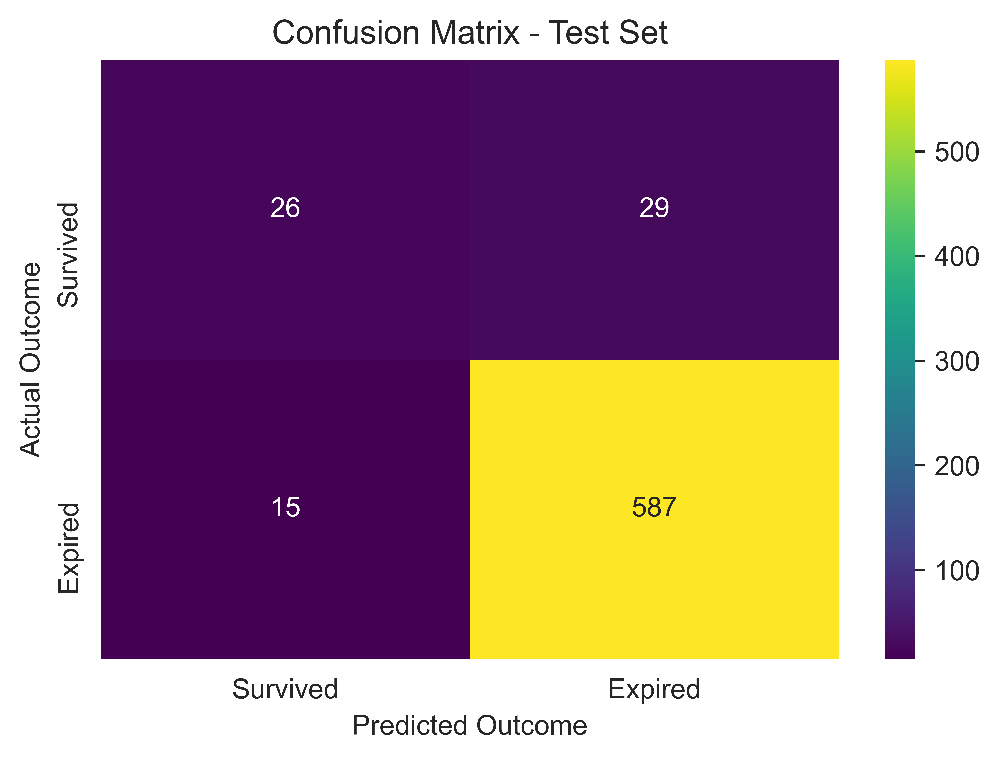

In [280]:
mpl.rcParams['figure.dpi'] = 1000
sns.set_style('darkgrid', {"axes.facecolor": ".9"})
sns.color_palette("viridis", as_cmap=True)
plot_confusion_matrix(y_test, y_test_pred, 'Test Set')

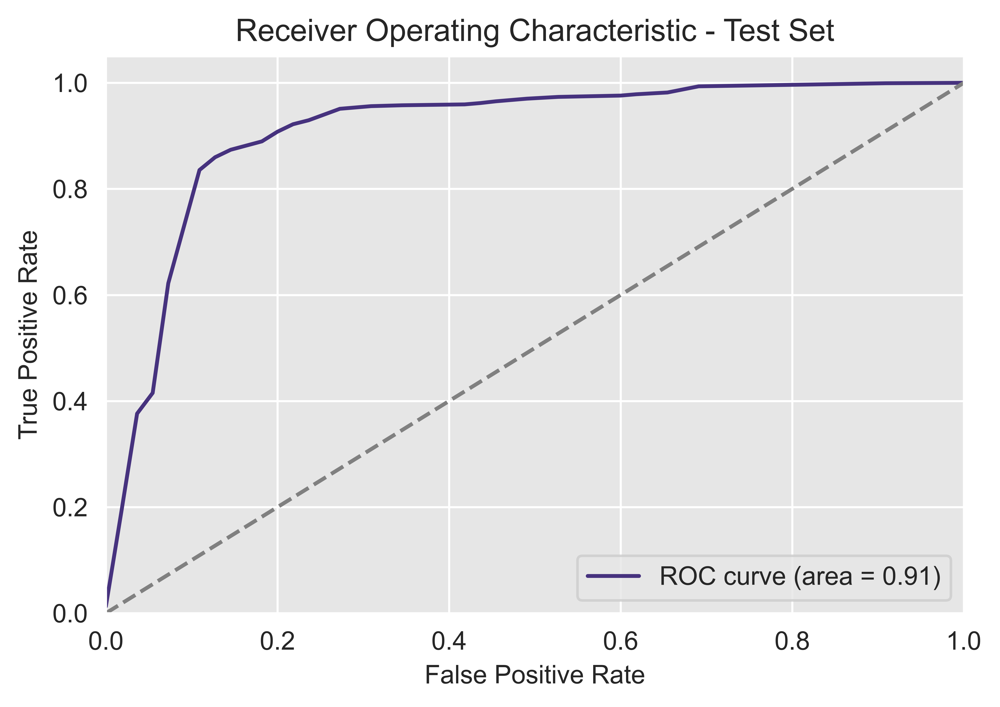

In [281]:
mpl.rcParams['figure.dpi'] = 1000
sns.set_style('darkgrid', {"axes.facecolor": ".9"})
sns.color_palette("viridis", as_cmap=True)
plot_roc_curve(y_test, y_test_proba, 'Test Set')

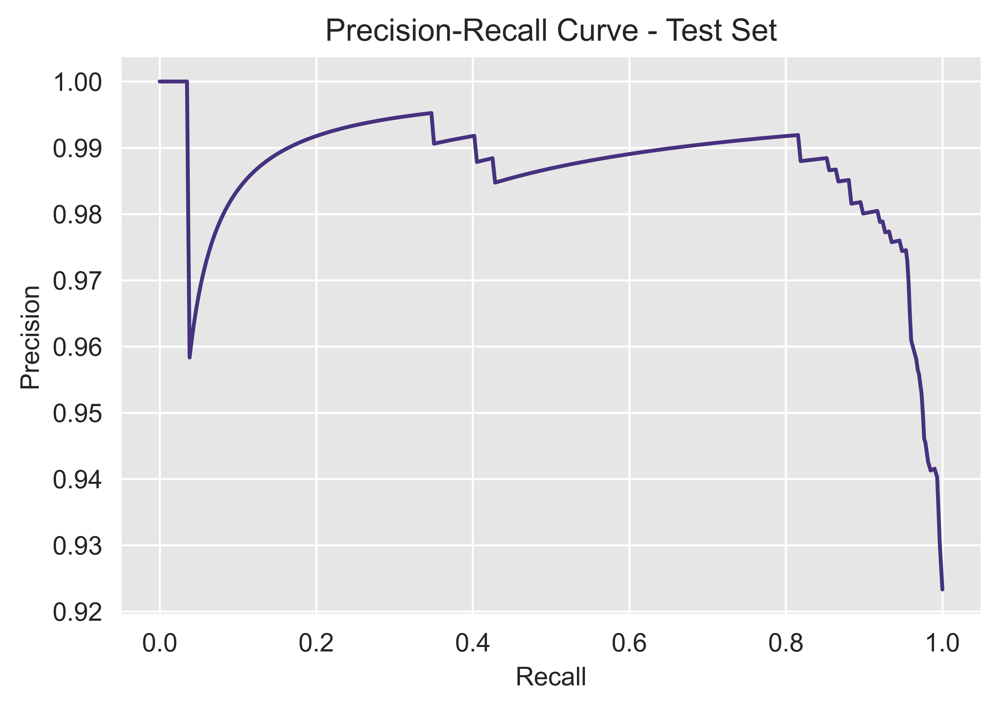

In [282]:
mpl.rcParams['figure.dpi'] = 1000
sns.set_style('darkgrid', {"axes.facecolor": ".9"})
sns.color_palette("viridis", as_cmap=True)
plot_precision_recall_curve(y_test, y_test_proba, 'Test Set')

## Perform machine learning while searching for best hyperparameters with Logistic Regression Model Using L2 Solver (LASSO)

In [283]:
# Tune hyperparameters

alphas = [1.0, 0.1, 0.01, 0.001, 0.0001, 0.00001] # Coarse hyperparameter search

roc_auc_val_list = []

for alpha in alphas:
    model, y_train_pred, y_val_pred, y_test_pred, y_train_proba, y_val_proba, y_test_proba, roc_auc_val, roc_auc_test = lasso_classifier(alpha, X_train, y_train, X_val, y_val, X_test, y_test, penalty='l2', iterations=1000, print_out=False)
    roc_auc_val_list.append(roc_auc_val)

### Best hyperparameter and AUROC

In [284]:
roc_auc_val_df = pd.DataFrame({'Alpha':alphas, 'AUROC':roc_auc_val_list})
best_alpha = alphas[roc_auc_val_list.index(max(roc_auc_val_list))]
display(roc_auc_val_df)
display(roc_auc_val_df[roc_auc_val_df['Alpha'] == best_alpha])

,Alpha,AUROC
0,1.00000,0.902647
1,0.10000,0.904553
2,0.01000,0.899229
3,0.00100,0.901891
4,0.00010,0.901104
5,0.00001,0.901407


,Alpha,AUROC
1,0.1,0.904553


## Re-train with best alpha value

In [285]:
model, y_train_pred, y_val_pred, y_test_pred, y_train_proba, y_val_proba, y_test_proba, roc_auc_val, roc_auc_test = lasso_classifier(best_alpha, X_train, y_train, X_val, y_val, X_test, y_test, iterations=1000, print_out=False)

## Generate plots for analysis

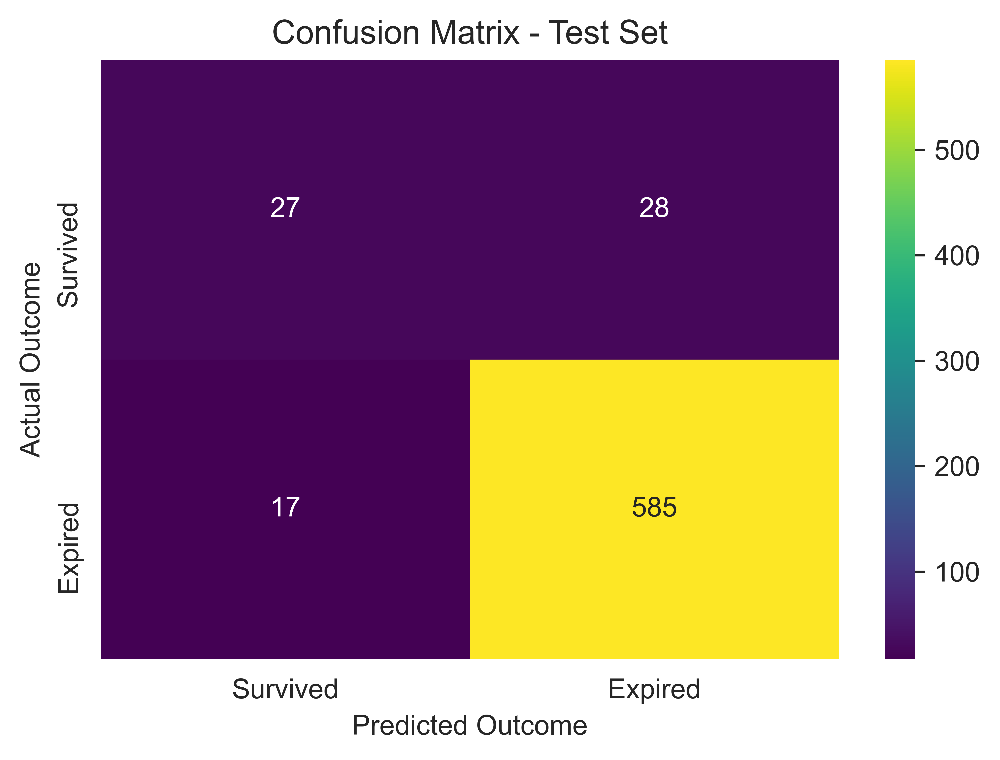

In [286]:
mpl.rcParams['figure.dpi'] = 1000
sns.set_style('darkgrid', {"axes.facecolor": ".9"})
sns.color_palette("viridis", as_cmap=True)
plot_confusion_matrix(y_test, y_test_pred, 'Test Set')

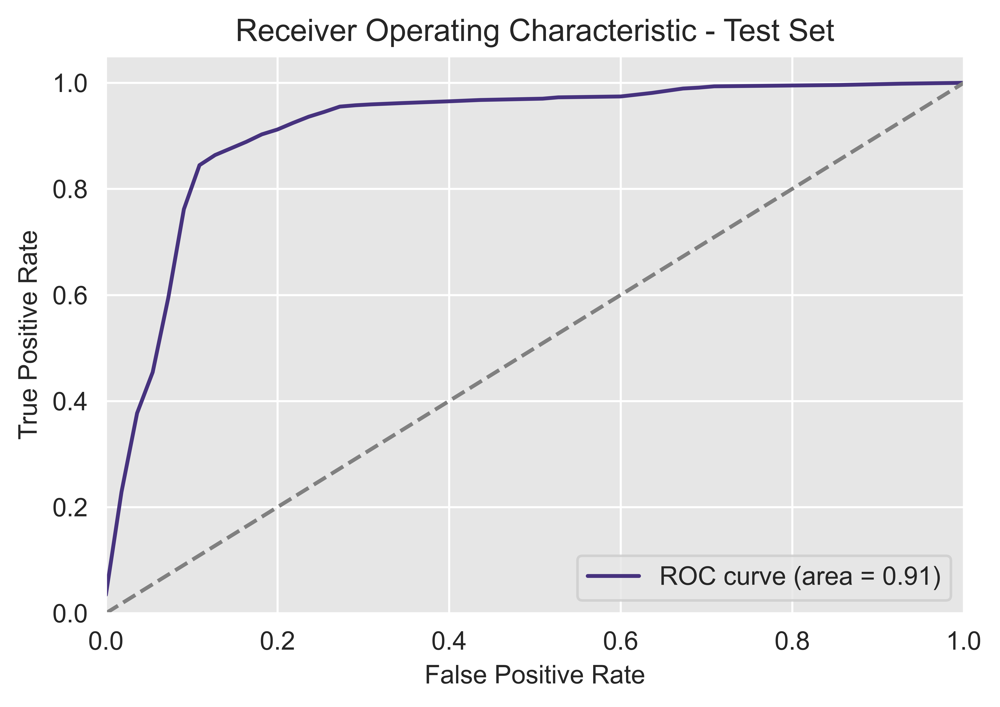

In [287]:
mpl.rcParams['figure.dpi'] = 1000
sns.set_style('darkgrid', {"axes.facecolor": ".9"})
sns.color_palette("viridis", as_cmap=True)
plot_roc_curve(y_test, y_test_proba, 'Test Set')

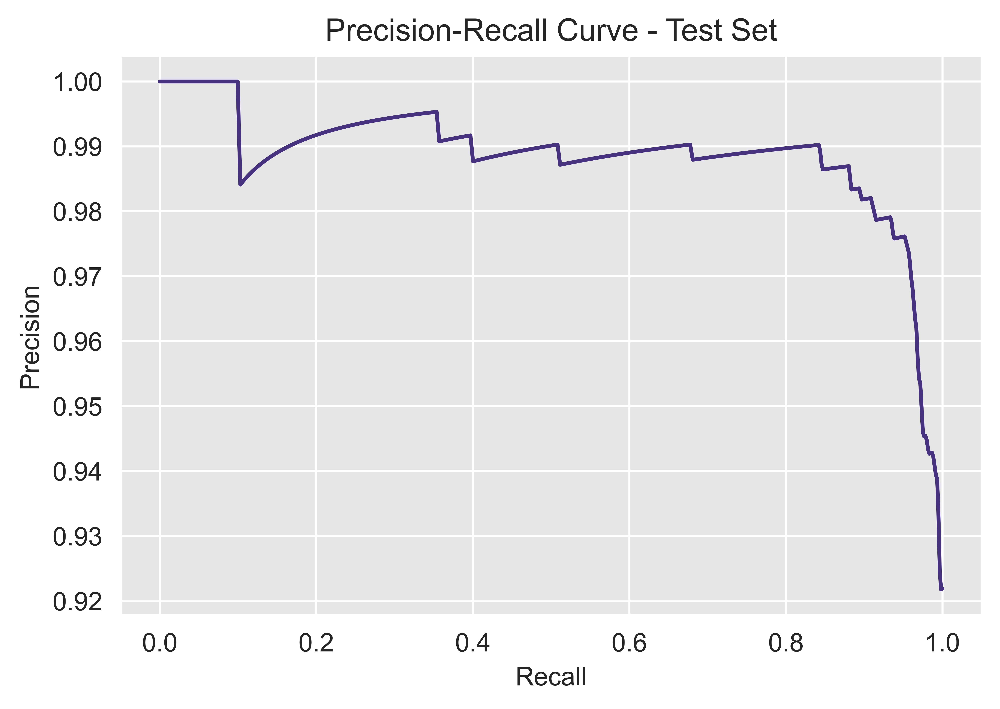

In [288]:
mpl.rcParams['figure.dpi'] = 1000
sns.set_style('darkgrid', {"axes.facecolor": ".9"})
sns.color_palette("viridis", as_cmap=True)
plot_precision_recall_curve(y_test, y_test_proba, 'Test Set')

## Perform machine learning while searching for best hyperparameters with Logistic Regression Model Using Elastic Net Penalty

> Technically we need to tune `l1_ratio` separately. For now we will just use `0.5` to use a balanced approach.

In [289]:
# Tune hyperparameters

alphas = [1.0, 0.1, 0.01, 0.001, 0.0001, 0.00001] # Coarse hyperparameter search

roc_auc_val_list = []

for alpha in alphas:
    model, y_train_pred, y_val_pred, y_test_pred, y_train_proba, y_val_proba, y_test_proba, roc_auc_val, roc_auc_test = lasso_classifier(alpha, X_train, y_train, X_val, y_val, X_test, y_test, l1_ratio=0.5, penalty='elasticnet', iterations=10000, solver='saga', print_out=False)
    roc_auc_val_list.append(roc_auc_val)

### Best hyperparameter and AUROC

In [290]:
roc_auc_val_df = pd.DataFrame({'Alpha':alphas, 'AUROC':roc_auc_val_list})
best_alpha = alphas[roc_auc_val_list.index(max(roc_auc_val_list))]
display(roc_auc_val_df)
display(roc_auc_val_df[roc_auc_val_df['Alpha'] == best_alpha])

,Alpha,AUROC
0,1.00000,0.843987
1,0.10000,0.844048
2,0.01000,0.844048
3,0.00100,0.844018
4,0.00010,0.844048
5,0.00001,0.844048


,Alpha,AUROC
1,0.1,0.844048


## Re-train with best alpha value

In [291]:
model, y_train_pred, y_val_pred, y_test_pred, y_train_proba, y_val_proba, y_test_proba, roc_auc_val, roc_auc_test = lasso_classifier(best_alpha, X_train, y_train, X_val, y_val, X_test, y_test, iterations=1000, print_out=False)

## Generate plots for analysis

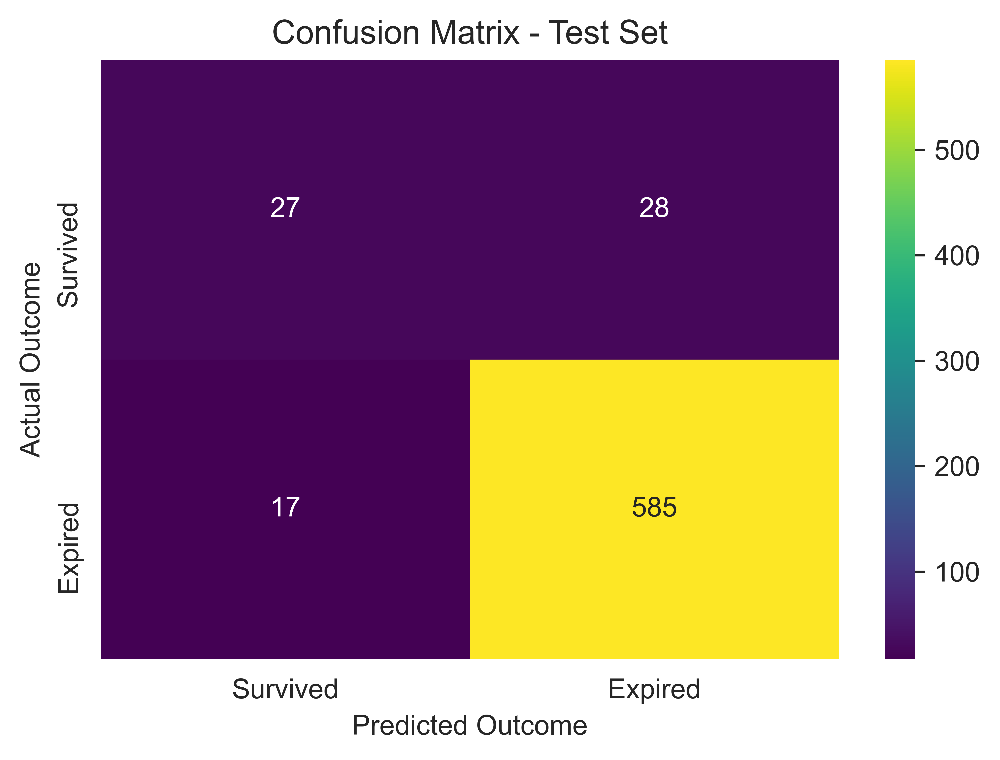

In [292]:
mpl.rcParams['figure.dpi'] = 1000
sns.set_style('darkgrid', {"axes.facecolor": ".9"})
sns.color_palette("viridis", as_cmap=True)
plot_confusion_matrix(y_test, y_test_pred, 'Test Set')

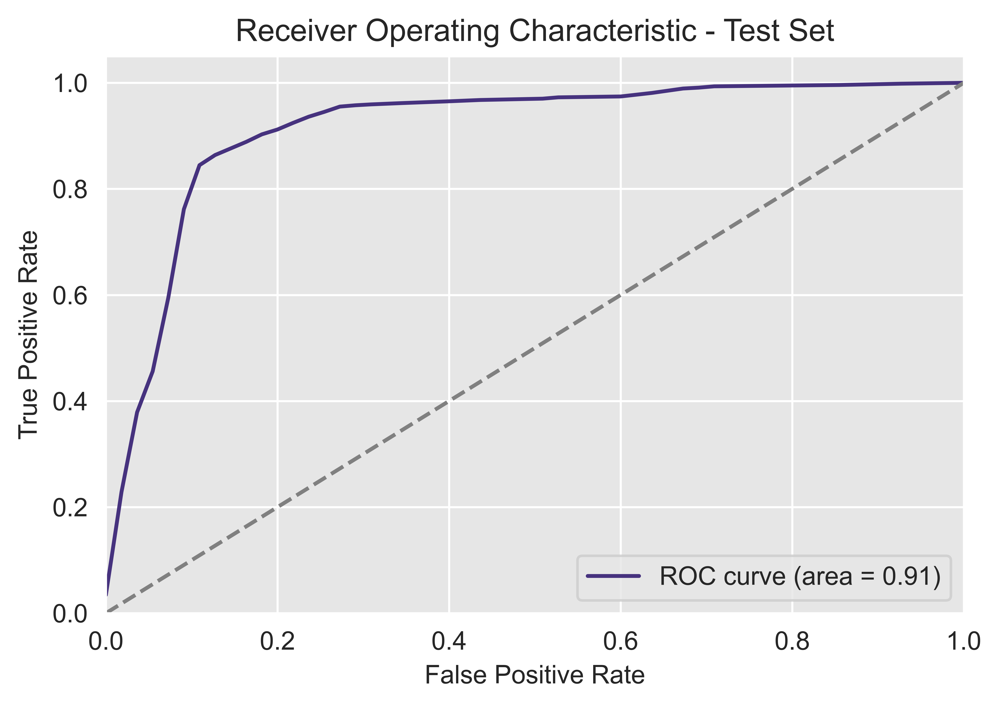

In [293]:
mpl.rcParams['figure.dpi'] = 1000
sns.set_style('darkgrid', {"axes.facecolor": ".9"})
sns.color_palette("viridis", as_cmap=True)
plot_roc_curve(y_test, y_test_proba, 'Test Set')

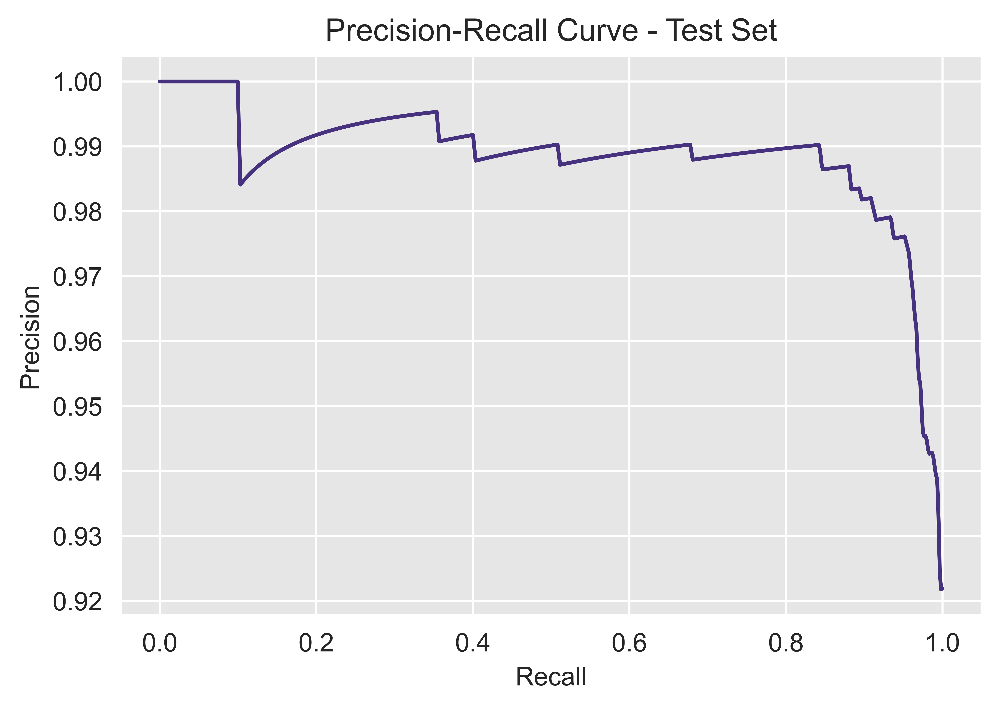

In [294]:
mpl.rcParams['figure.dpi'] = 1000
sns.set_style('darkgrid', {"axes.facecolor": ".9"})
sns.color_palette("viridis", as_cmap=True)
plot_precision_recall_curve(y_test, y_test_proba, 'Test Set')

## Perform machine learning while searching for best hyperparameters with KNN Model

### KNN Distance

In [295]:
# Tune hyperparameters

ks = [1, 5, 10, 20, 50, 100, 500, 1000, 5000] # Coarse hyperparameter search

roc_auc_val_list = []

for k in ks:
    model, y_train_pred, y_val_pred, y_test_pred, y_train_proba, y_val_proba, y_test_proba, roc_auc_val, roc_auc_test = KNeighbors_classifier(k, X_train, y_train, X_val, y_val, X_test, y_test, print_out=False)
    roc_auc_val_list.append(roc_auc_val)

### Best hyperparameter and AUROC

In [296]:
roc_auc_val_df = pd.DataFrame({'K':ks, 'AUROC':roc_auc_val_list})
best_k = ks[roc_auc_val_list.index(max(roc_auc_val_list))]
display(roc_auc_val_df)
display(roc_auc_val_df[roc_auc_val_df['K'] == best_k])

,K,AUROC
0,1,0.570942
1,5,0.710180
2,10,0.762275
3,20,0.791983
4,50,0.810195
5,100,0.803993
6,500,0.741582
7,1000,0.730843
8,5000,0.757193


,K,AUROC
4,50,0.810195


## Perform fine search for best hyperparameter based on initial coarse search

In [297]:
# Tune hyperparameters

ks = range(20, 520, 20) # Fine hyperparameter search

roc_auc_val_list = []

for k in ks:
    model, y_train_pred, y_val_pred, y_test_pred, y_train_proba, y_val_proba, y_test_proba, roc_auc_val, roc_auc_test = KNeighbors_classifier(k, X_train, y_train, X_val, y_val, X_test, y_test, print_out=False)
    roc_auc_val_list.append(roc_auc_val)

### Best hyperparameter and AUROC

In [298]:
roc_auc_val_df = pd.DataFrame({'K':ks, 'AUROC':roc_auc_val_list})
best_k = ks[roc_auc_val_list.index(max(roc_auc_val_list))]
display(roc_auc_val_df)
display(roc_auc_val_df[roc_auc_val_df['K'] == best_k])

,K,AUROC
0,20,0.791983
1,40,0.807185
2,60,0.810649
3,80,0.807261
4,100,0.803993
5,120,0.800756
6,140,0.796975
7,160,0.790107
8,180,0.787838
9,200,0.790198


,K,AUROC
2,60,0.810649


## Re-train with best K value

In [299]:
model, y_train_pred, y_val_pred, y_test_pred, y_train_proba, y_val_proba, y_test_proba, roc_auc_val, roc_auc_test = KNeighbors_classifier(best_k, X_train, y_train, X_val, y_val, X_test, y_test, print_out=False)

## Generate plots for analysis

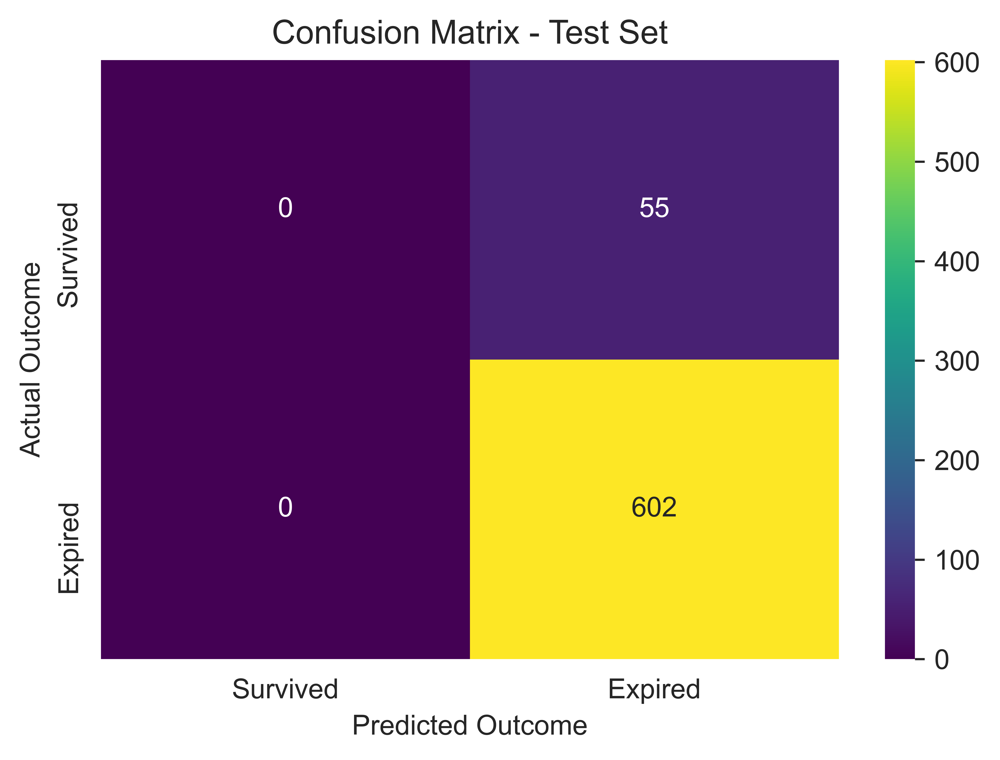

In [300]:
mpl.rcParams['figure.dpi'] = 1000
sns.set_style('darkgrid', {"axes.facecolor": ".9"})
sns.color_palette("viridis", as_cmap=True)
plot_confusion_matrix(y_test, y_test_pred, 'Test Set')

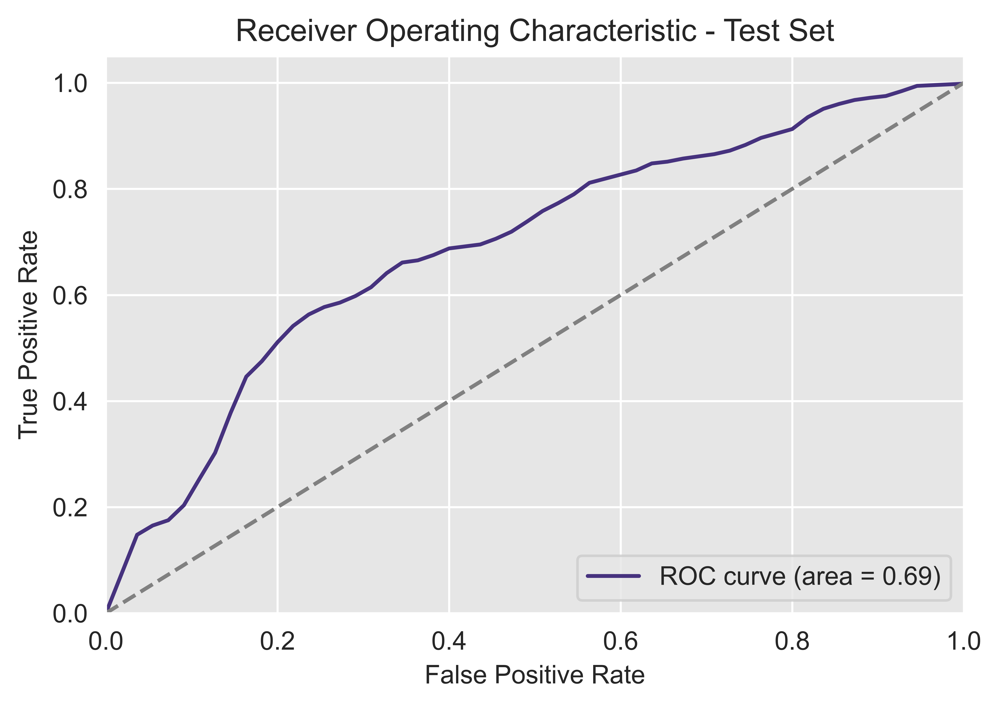

In [301]:
mpl.rcParams['figure.dpi'] = 1000
sns.set_style('darkgrid', {"axes.facecolor": ".9"})
sns.color_palette("viridis", as_cmap=True)
plot_roc_curve(y_test, y_test_proba, 'Test Set')

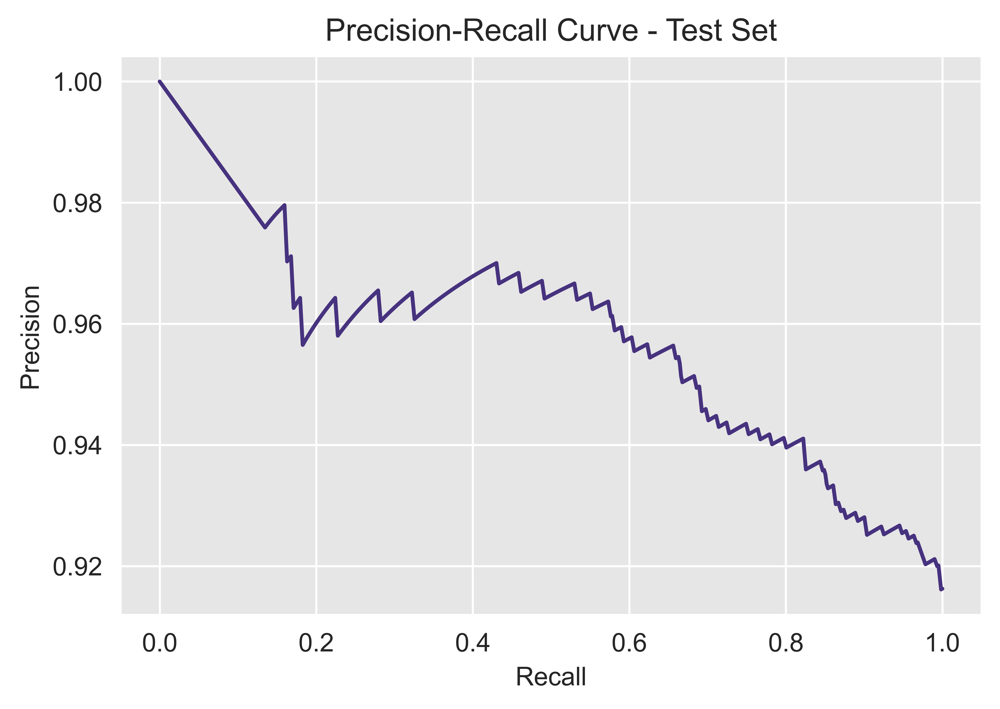

In [302]:
mpl.rcParams['figure.dpi'] = 1000
sns.set_style('darkgrid', {"axes.facecolor": ".9"})
sns.color_palette("viridis", as_cmap=True)
plot_precision_recall_curve(y_test, y_test_proba, 'Test Set')

# Let's try classifying using a subset of data available PTA/ On arrival

> This was performed using data fields that you would have available from the radio report/ initial set of vital signs from the patient (excluding `Pulse Oximetry`, limited sample pool too much)

> Only included cases that were labeled a `Thoracotomy` via the `HMRRHGCTRLSURGTYPE` data field, occurred within the first `20 minutes` on `Day 1` according to the `HMRRHGCTRLSURGMINS` and `HMRRHGCTRLSURGDAYS` data fields (*for some years only `HMRRHGCTRLSURGHRS` is available and so `HMRRHGCTRLSURGMINS` is derived by multiplying this by `60 minutes`*).

> Anybody who did not have a know `EDDISCHARGEDISPOSITION` **or** `HOSPDISCHARGEDISPOSITION` was excluded

In [303]:
TRAUMA_fp = '/Users/JakeCanfield/Documents/Trauma_Surgery_Research/data/Combined_data/MLTRAUMA_df_%i.csv'
ICDPROCEDURE_fp = '/Users/JakeCanfield/Documents/Trauma_Surgery_Research/data/Combined_data/MLICDPROCEDURE_df_%i.csv'

years = range(2017, 2023)

# Preload column names
TRAUMA_cols = pd.read_csv(TRAUMA_fp % 2017, nrows=1).columns.tolist()
ICDPROCEDURE_cols = pd.read_csv(ICDPROCEDURE_fp % 2017, nrows=1).columns.tolist()

# Collect DataFrames in lists
trauma_dfs = []
icdprocedure_dfs = []

for year in years:
    trauma_df = pd.read_csv(TRAUMA_fp % year, usecols=TRAUMA_cols)
    trauma_df['Year'] = year
    icdprocedure_df = pd.read_csv(ICDPROCEDURE_fp % year, usecols=ICDPROCEDURE_cols)
    icdprocedure_df['Year'] = year
    trauma_dfs.append(trauma_df)
    icdprocedure_dfs.append(icdprocedure_df)

# Concatenate DataFrames once at the end
TRAUMA_all_df = pd.concat(trauma_dfs, ignore_index=True)
ICDPROCEDURE_all_df = pd.concat(icdprocedure_dfs, ignore_index=True)

TRAUMA_all_df = TRAUMA_all_df.dropna(subset=['HMRRHGCTRLSURGMINS'])
TRAUMA_all_df = TRAUMA_all_df.dropna(subset=['AGEYEARS'])
TRAUMA_all_df['HMRRHGCTRLSURGMINS'] = TRAUMA_all_df['HMRRHGCTRLSURGMINS'].round().astype(int)
TRAUMA_all_df = TRAUMA_all_df.loc[(TRAUMA_all_df['HMRRHGCTRLSURGMINS'] <= 20) & (TRAUMA_all_df['HMRRHGCTRLSURGDAYS'] <= 1.0)]
ICDPROCEDURE_all_df = ICDPROCEDURE_all_df.loc[ICDPROCEDURE_all_df['INC_KEY'].isin(np.unique(TRAUMA_all_df['INC_KEY']))]

# Step 1: Drop rows that have NaN in both columns
TRAUMA_all_df = TRAUMA_all_df.dropna(subset=['EDDISCHARGEDISPOSITION', 'HOSPDISCHARGEDISPOSITION'], how='all')

# Step 2: Replace NaN values in one column with the value from the other column
TRAUMA_all_df['EDDISCHARGEDISPOSITION'] = TRAUMA_all_df['EDDISCHARGEDISPOSITION'].combine_first(TRAUMA_all_df['HOSPDISCHARGEDISPOSITION'])
TRAUMA_all_df['HOSPDISCHARGEDISPOSITION'] = TRAUMA_all_df['HOSPDISCHARGEDISPOSITION'].combine_first(TRAUMA_all_df['EDDISCHARGEDISPOSITION'])

# Step 3: Create the 'DECEASED' column
TRAUMA_all_df['DECEASED'] = 0  # Initialize with 0 (Survived)
TRAUMA_all_df.loc[(TRAUMA_all_df['EDDISCHARGEDISPOSITION'] == 5.0) | 
                  (TRAUMA_all_df['HOSPDISCHARGEDISPOSITION'] == 5.0), 'DECEASED'] = 1

# Step 4: Drop the 'EDDISCHARGEDISPOSITION' and 'HOSPDISCHARGEDISPOSITION' columns
TRAUMA_all_df = TRAUMA_all_df.drop(columns=['EDDISCHARGEDISPOSITION', 'HOSPDISCHARGEDISPOSITION', 'INC_KEY'])

# Step 5: Select rows of interest
input_list = ['SEX', 'AGEYEARS', 'TRANSPORTMODE', 'EMSSBP', 'EMSPULSERATE', 'EMSRESPIRATORYRATE', 
              'EMSTOTALGCS', 'PREHOSPITALCARDIACARREST', 'SBP', 'PULSERATE', 
              'RESPIRATORYRATE', 'TOTALGCS', 'HOSPITALTYPE', 'TRAUMATYPE', 'MECHANISM', 'TCCSBPLT30',
              'TCCGCSLE13', 'TCC10RR29', 'TCCPEN', 'TCCCHEST', 'TCCLONGBONE', 'TCCCRUSHED', 'TCCAMPUTATION',
              'TCCPELVIC', 'TCCSKULLFRACTURE', 'TCCPARALYSIS'
             ]
required_list = ['DECEASED']
TRAUMA_all_df = TRAUMA_all_df.loc[:, input_list + required_list]

TRAUMA_all_df = TRAUMA_all_df.dropna(subset=input_list, how='any')

# Step 8: Remove columns ending in _BIU
TRAUMA_all_df = TRAUMA_all_df.drop(TRAUMA_all_df.filter(regex='_BIU$').columns, axis=1)

# Step 9: Convert strings to numbers

# Identify columns with string values
string_columns = TRAUMA_all_df.select_dtypes(include='object').columns

# Initialize a dictionary to store mapping dictionaries
mapping_dicts = {}

# Convert each unique string to an integer and create mapping dictionaries
for col in string_columns:
    unique_strings = TRAUMA_all_df[col].unique()
    string_to_int = {string: idx for idx, string in enumerate(unique_strings)}
    int_to_string = {idx: string for string, idx in string_to_int.items()}
    
    # Store the mapping dictionaries
    mapping_dicts[col] = {
        'string_to_int': string_to_int,
        'int_to_string': int_to_string
    }
    
    # Map the strings to integers in the DataFrame
    TRAUMA_all_df[col] = TRAUMA_all_df[col].map(string_to_int)

# Display results
display(TRAUMA_all_df.tail())
print(np.shape(TRAUMA_all_df))
display(ICDPROCEDURE_all_df.tail())
print(np.shape(ICDPROCEDURE_all_df))

# Free up memory
del trauma_dfs, icdprocedure_dfs

,SEX,AGEYEARS,TRANSPORTMODE,EMSSBP,EMSPULSERATE,EMSRESPIRATORYRATE,EMSTOTALGCS,PREHOSPITALCARDIACARREST,SBP,PULSERATE,...,TCC10RR29,TCCPEN,TCCCHEST,TCCLONGBONE,TCCCRUSHED,TCCAMPUTATION,TCCPELVIC,TCCSKULLFRACTURE,TCCPARALYSIS,DECEASED
10769,2.0,30.0,1.0,0.0,0.0,0.0,3.0,1.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1
10773,2.0,76.0,1.0,104.0,77.0,18.0,3.0,2.0,104.0,89.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1
10774,2.0,30.0,1.0,146.0,109.0,0.0,3.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1
10781,1.0,20.0,1.0,0.0,0.0,0.0,3.0,1.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1
10784,1.0,30.0,1.0,138.0,112.0,10.0,8.0,2.0,133.0,53.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1


(1784, 27)


,INC_KEY,ICDPROCEDURECODE,PROCEDUREMINS,PROCEDUREDAYS,Year
274140,220072330368,30233N1,7.2,1.0,2022
274141,220072330368,3E080GC,0.0,1.0,2022
274142,220072330368,5A12012,0.0,1.0,2022
274143,220072330368,5A1935Z,3.0,1.0,2022
274144,220072330368,BW40ZZZ,0.0,1.0,2022


(103042, 5)


## Create data splits

In [304]:
X_train, y_train, X_val, y_val, X_test, y_test = make_splits(TRAUMA_all_df, y_column='DECEASED')

## Perform machine learning while searching for best hyperparameters with Logistic Regression Model Using L2 penalty (LASSO)

In [305]:
# Tune hyperparameters

alphas = [1.0, 0.1, 0.01, 0.001, 0.0001, 0.00001] # Coarse hyperparameter search

roc_auc_val_list = []

for alpha in alphas:
    model, y_train_pred, y_val_pred, y_test_pred, y_train_proba, y_val_proba, y_test_proba, roc_auc_val, roc_auc_test = lasso_classifier(alpha, X_train, y_train, X_val, y_val, X_test, y_test, penalty='l2', iterations=1000, print_out=False)
    roc_auc_val_list.append(roc_auc_val)

### Best hyperparameter and AUROC

In [306]:
roc_auc_val_df = pd.DataFrame({'Alpha':alphas, 'AUROC':roc_auc_val_list})
best_alpha = alphas[roc_auc_val_list.index(max(roc_auc_val_list))]
display(roc_auc_val_df)
display(roc_auc_val_df[roc_auc_val_df['Alpha'] == best_alpha])

,Alpha,AUROC
0,1.00000,0.882639
1,0.10000,0.876736
2,0.01000,0.863194
3,0.00100,0.848611
4,0.00010,0.849653
5,0.00001,0.847569


,Alpha,AUROC
0,1.0,0.882639


## Re-train with best alpha value

In [307]:
model, y_train_pred, y_val_pred, y_test_pred, y_train_proba, y_val_proba, y_test_proba, roc_auc_val, roc_auc_test = lasso_classifier(best_alpha, X_train, y_train, X_val, y_val, X_test, y_test, iterations=1000, print_out=False)

## Generate plots for analysis

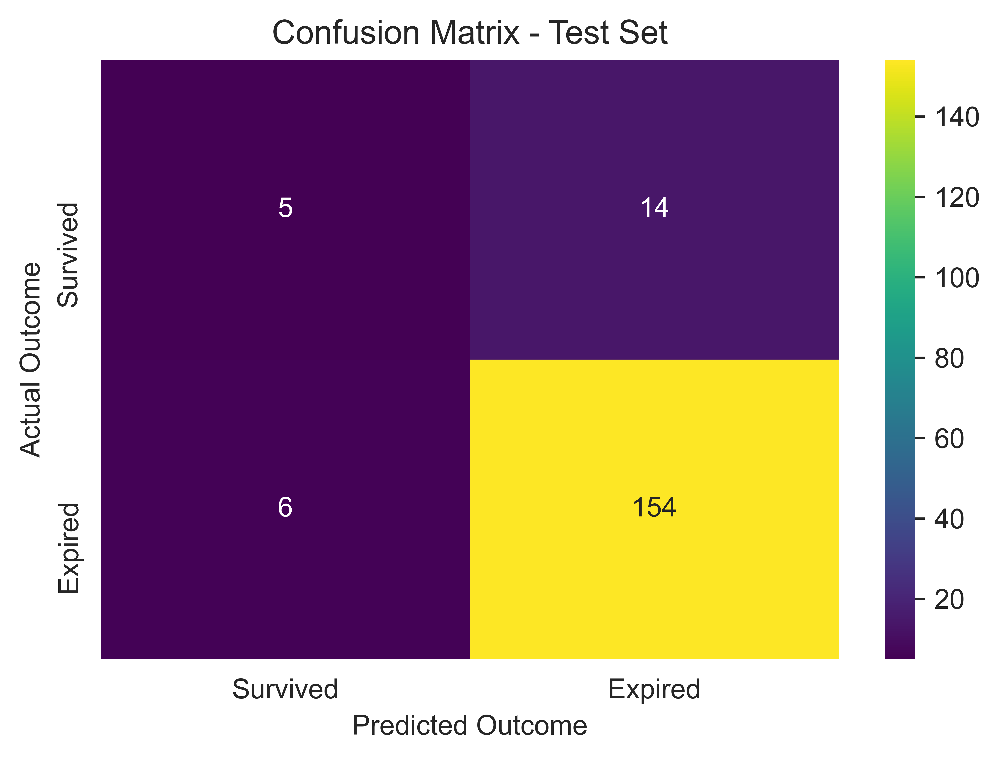

In [308]:
mpl.rcParams['figure.dpi'] = 1000
sns.set_style('darkgrid', {"axes.facecolor": ".9"})
sns.color_palette("viridis", as_cmap=True)
plot_confusion_matrix(y_test, y_test_pred, 'Test Set')

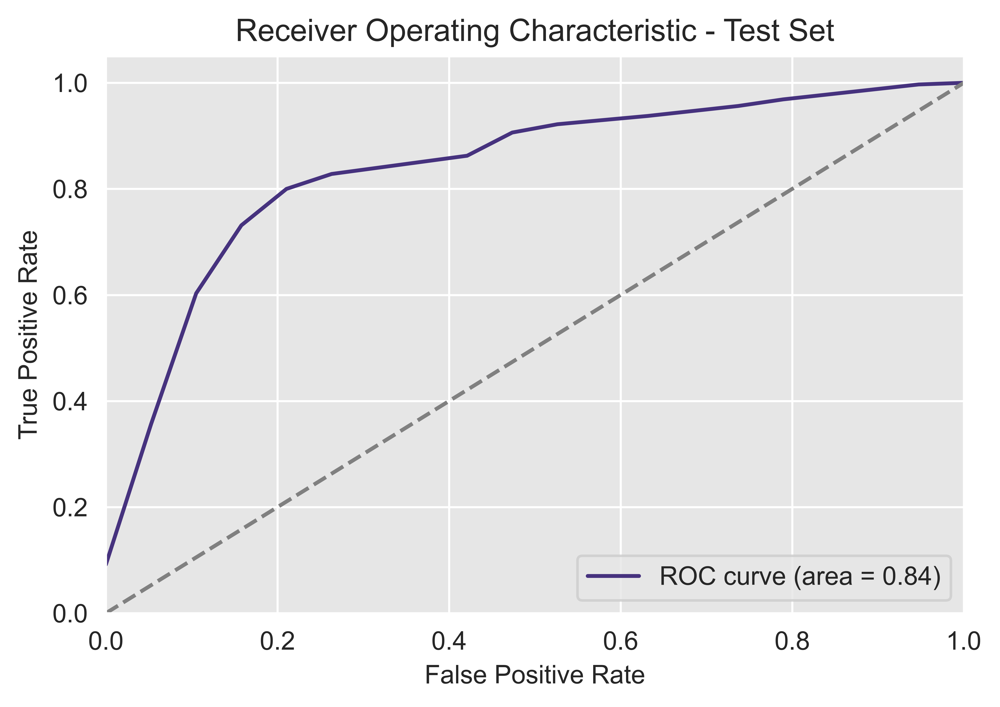

In [309]:
mpl.rcParams['figure.dpi'] = 1000
sns.set_style('darkgrid', {"axes.facecolor": ".9"})
sns.color_palette("viridis", as_cmap=True)
plot_roc_curve(y_test, y_test_proba, 'Test Set')

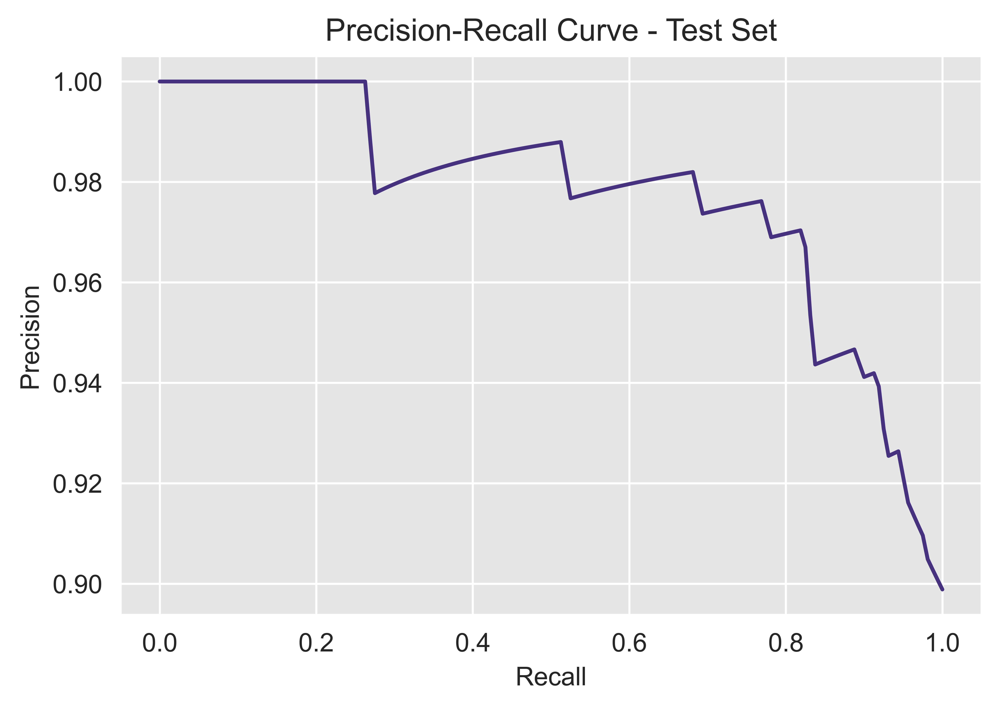

In [310]:
mpl.rcParams['figure.dpi'] = 1000
sns.set_style('darkgrid', {"axes.facecolor": ".9"})
sns.color_palette("viridis", as_cmap=True)
plot_precision_recall_curve(y_test, y_test_proba, 'Test Set')

## Now let's try reducing this down to only information give over the radio PTA

In [352]:
TRAUMA_fp = '/Users/JakeCanfield/Documents/Trauma_Surgery_Research/data/Combined_data/MLTRAUMA_df_%i.csv'
ICDPROCEDURE_fp = '/Users/JakeCanfield/Documents/Trauma_Surgery_Research/data/Combined_data/MLICDPROCEDURE_df_%i.csv'

years = range(2017, 2023)

# Preload column names
TRAUMA_cols = pd.read_csv(TRAUMA_fp % 2017, nrows=1).columns.tolist()
ICDPROCEDURE_cols = pd.read_csv(ICDPROCEDURE_fp % 2017, nrows=1).columns.tolist()

# Collect DataFrames in lists
trauma_dfs = []
icdprocedure_dfs = []

for year in years:
    trauma_df = pd.read_csv(TRAUMA_fp % year, usecols=TRAUMA_cols)
    trauma_df['Year'] = year
    icdprocedure_df = pd.read_csv(ICDPROCEDURE_fp % year, usecols=ICDPROCEDURE_cols)
    icdprocedure_df['Year'] = year
    trauma_dfs.append(trauma_df)
    icdprocedure_dfs.append(icdprocedure_df)

# Concatenate DataFrames once at the end
TRAUMA_all_df = pd.concat(trauma_dfs, ignore_index=True)
ICDPROCEDURE_all_df = pd.concat(icdprocedure_dfs, ignore_index=True)

TRAUMA_all_df = TRAUMA_all_df.dropna(subset=['HMRRHGCTRLSURGMINS'])
TRAUMA_all_df = TRAUMA_all_df.dropna(subset=['AGEYEARS'])
TRAUMA_all_df['HMRRHGCTRLSURGMINS'] = TRAUMA_all_df['HMRRHGCTRLSURGMINS'].round().astype(int)
TRAUMA_all_df = TRAUMA_all_df.loc[(TRAUMA_all_df['HMRRHGCTRLSURGMINS'] <= 15) & (TRAUMA_all_df['HMRRHGCTRLSURGDAYS'] <= 1.0)]
ICDPROCEDURE_all_df = ICDPROCEDURE_all_df.loc[ICDPROCEDURE_all_df['INC_KEY'].isin(np.unique(TRAUMA_all_df['INC_KEY']))]

# Step 1: Drop rows that have NaN in both columns
TRAUMA_all_df = TRAUMA_all_df.dropna(subset=['EDDISCHARGEDISPOSITION', 'HOSPDISCHARGEDISPOSITION'], how='all')

# Step 2: Replace NaN values in one column with the value from the other column
TRAUMA_all_df['EDDISCHARGEDISPOSITION'] = TRAUMA_all_df['EDDISCHARGEDISPOSITION'].combine_first(TRAUMA_all_df['HOSPDISCHARGEDISPOSITION'])
TRAUMA_all_df['HOSPDISCHARGEDISPOSITION'] = TRAUMA_all_df['HOSPDISCHARGEDISPOSITION'].combine_first(TRAUMA_all_df['EDDISCHARGEDISPOSITION'])

# Step 3: Create the 'DECEASED' column
TRAUMA_all_df['DECEASED'] = 0  # Initialize with 0 (Survived)
TRAUMA_all_df.loc[(TRAUMA_all_df['EDDISCHARGEDISPOSITION'] == 5.0) | 
                  (TRAUMA_all_df['HOSPDISCHARGEDISPOSITION'] == 5.0), 'DECEASED'] = 1

# Step 4: Drop the 'EDDISCHARGEDISPOSITION' and 'HOSPDISCHARGEDISPOSITION' columns
TRAUMA_all_df = TRAUMA_all_df.drop(columns=['EDDISCHARGEDISPOSITION', 'HOSPDISCHARGEDISPOSITION', 'INC_KEY'])

# Step 5: Select rows of interest
input_list = ['SEX', 'EMSSBP', 'EMSPULSERATE', 'EMSRESPIRATORYRATE', 'EMSTOTALGCS', 'PREHOSPITALCARDIACARREST', 'TRAUMATYPE']
required_list = ['DECEASED']
TRAUMA_all_df = TRAUMA_all_df.loc[:, input_list + required_list]

TRAUMA_all_df = TRAUMA_all_df.dropna(subset=input_list, how='any')

# Step 8: Remove columns ending in _BIU
TRAUMA_all_df = TRAUMA_all_df.drop(TRAUMA_all_df.filter(regex='_BIU$').columns, axis=1)

# Step 9: Convert strings to numbers

# Identify columns with string values
string_columns = TRAUMA_all_df.select_dtypes(include='object').columns

# Initialize a dictionary to store mapping dictionaries
mapping_dicts = {}

# Convert each unique string to an integer and create mapping dictionaries
for col in string_columns:
    unique_strings = TRAUMA_all_df[col].unique()
    string_to_int = {string: idx for idx, string in enumerate(unique_strings)}
    int_to_string = {idx: string for string, idx in string_to_int.items()}
    
    # Store the mapping dictionaries
    mapping_dicts[col] = {
        'string_to_int': string_to_int,
        'int_to_string': int_to_string
    }
    
    # Map the strings to integers in the DataFrame
    TRAUMA_all_df[col] = TRAUMA_all_df[col].map(string_to_int)

# Display results
display(TRAUMA_all_df.tail())
print(np.shape(TRAUMA_all_df))
display(ICDPROCEDURE_all_df.tail())
print(np.shape(ICDPROCEDURE_all_df))

# Free up memory
del trauma_dfs, icdprocedure_dfs

,SEX,EMSSBP,EMSPULSERATE,EMSRESPIRATORYRATE,EMSTOTALGCS,PREHOSPITALCARDIACARREST,TRAUMATYPE,DECEASED
10769,2.0,0.0,0.0,0.0,3.0,1.0,2.0,1
10773,2.0,104.0,77.0,18.0,3.0,2.0,1.0,1
10774,2.0,146.0,109.0,0.0,3.0,1.0,1.0,1
10781,1.0,0.0,0.0,0.0,3.0,1.0,2.0,1
10784,1.0,138.0,112.0,10.0,8.0,2.0,1.0,1


(2243, 8)


,INC_KEY,ICDPROCEDURECODE,PROCEDUREMINS,PROCEDUREDAYS,Year
274140,220072330368,30233N1,7.2,1.0,2022
274141,220072330368,3E080GC,0.0,1.0,2022
274142,220072330368,5A12012,0.0,1.0,2022
274143,220072330368,5A1935Z,3.0,1.0,2022
274144,220072330368,BW40ZZZ,0.0,1.0,2022


(89104, 5)


## Create data splits

In [353]:
X_train, y_train, X_val, y_val, X_test, y_test = make_splits(TRAUMA_all_df, y_column='DECEASED')

## Perform machine learning while searching for best hyperparameters with Logistic Regression Model Using L2 penalty (LASSO)

In [354]:
# Tune hyperparameters

alphas = [1.0, 0.1, 0.01, 0.001, 0.0001, 0.00001] # Coarse hyperparameter search

roc_auc_val_list = []

for alpha in alphas:
    model, y_train_pred, y_val_pred, y_test_pred, y_train_proba, y_val_proba, y_test_proba, roc_auc_val, roc_auc_test = lasso_classifier(alpha, X_train, y_train, X_val, y_val, X_test, y_test, penalty='l2', iterations=1000, print_out=False)
    roc_auc_val_list.append(roc_auc_val)

### Best hyperparameter and AUROC

In [355]:
roc_auc_val_df = pd.DataFrame({'Alpha':alphas, 'AUROC':roc_auc_val_list})
best_alpha = alphas[roc_auc_val_list.index(max(roc_auc_val_list))]
display(roc_auc_val_df)
display(roc_auc_val_df[roc_auc_val_df['Alpha'] == best_alpha])

,Alpha,AUROC
0,1.00000,0.784255
1,0.10000,0.798377
2,0.01000,0.800481
3,0.00100,0.800481
4,0.00010,0.800481
5,0.00001,0.800481


,Alpha,AUROC
2,0.01,0.800481


## Re-train with best alpha value

In [356]:
model, y_train_pred, y_val_pred, y_test_pred, y_train_proba, y_val_proba, y_test_proba, roc_auc_val, roc_auc_test = lasso_classifier(best_alpha, X_train, y_train, X_val, y_val, X_test, y_test, iterations=1000, print_out=False)

## Generate plots for analysis

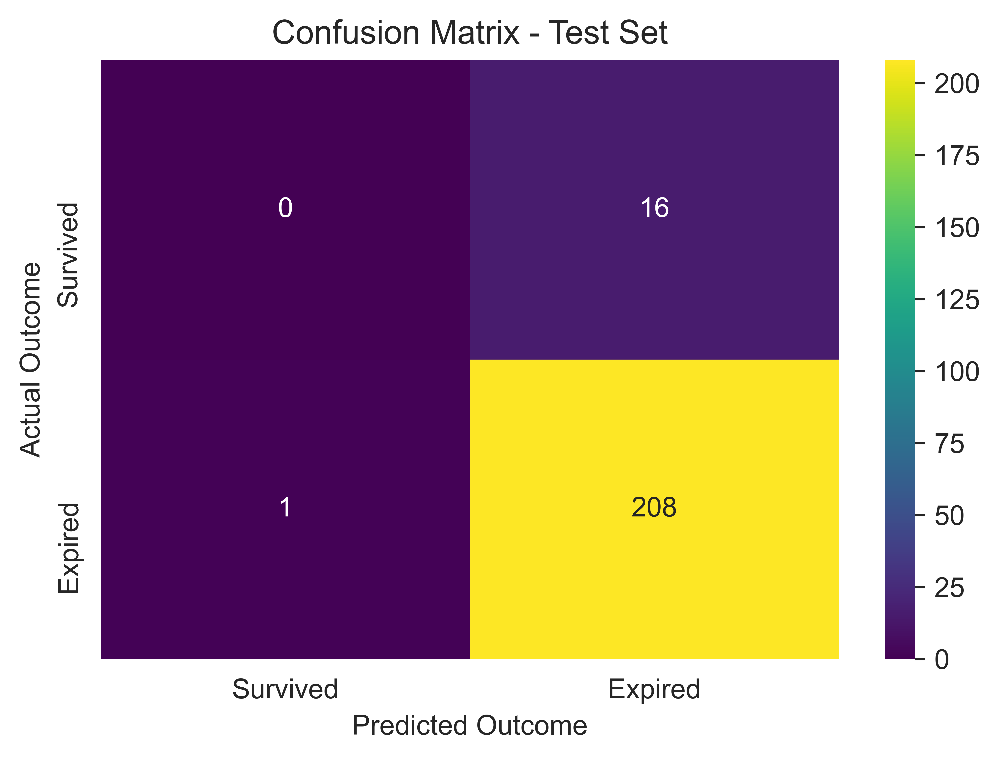

In [357]:
mpl.rcParams['figure.dpi'] = 1000
sns.set_style('darkgrid', {"axes.facecolor": ".9"})
sns.color_palette("viridis", as_cmap=True)
plot_confusion_matrix(y_test, y_test_pred, 'Test Set')

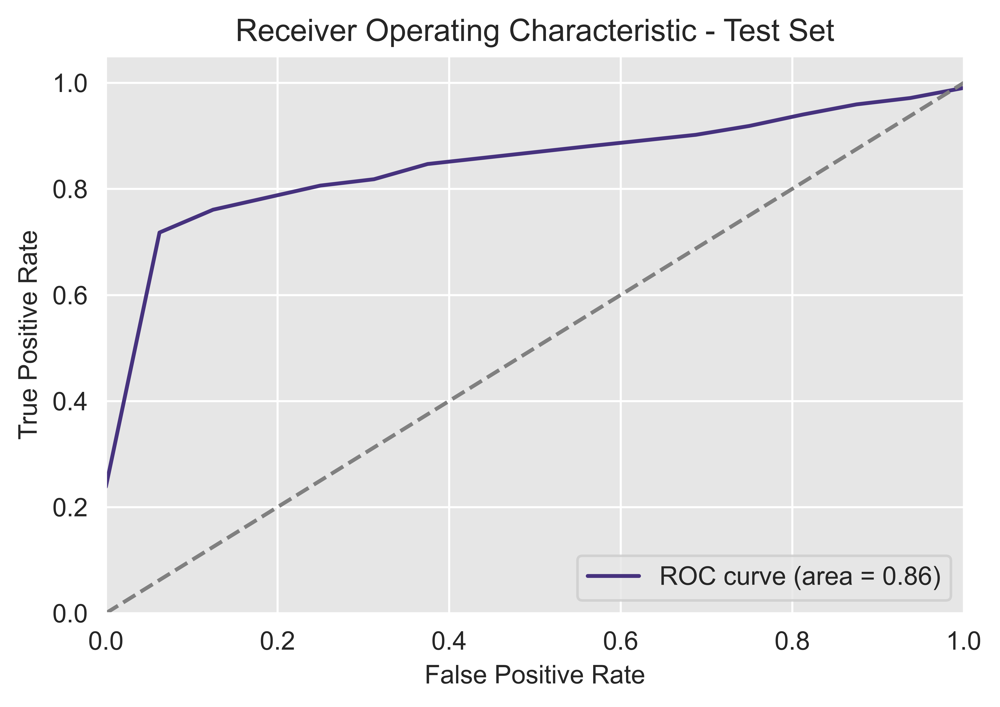

In [358]:
mpl.rcParams['figure.dpi'] = 1000
sns.set_style('darkgrid', {"axes.facecolor": ".9"})
sns.color_palette("viridis", as_cmap=True)
plot_roc_curve(y_test, y_test_proba, 'Test Set')

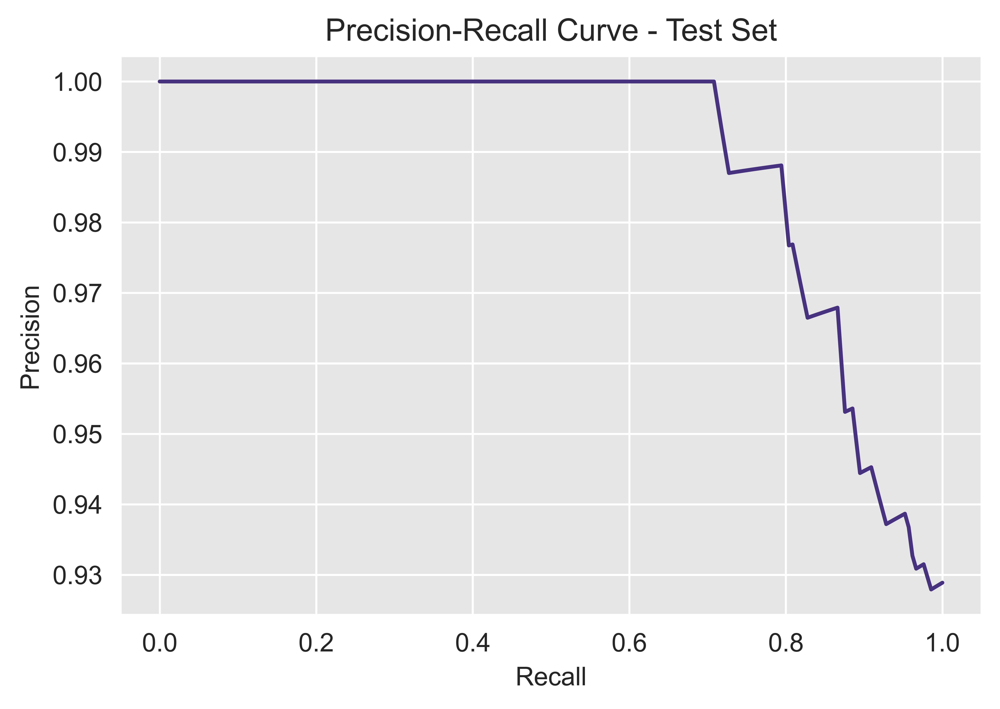

In [359]:
mpl.rcParams['figure.dpi'] = 1000
sns.set_style('darkgrid', {"axes.facecolor": ".9"})
sns.color_palette("viridis", as_cmap=True)
plot_precision_recall_curve(y_test, y_test_proba, 'Test Set')

## Let's try a Gradient Boost Machine (GBM)

## Create data splits

In [360]:
X_train, y_train, X_val, y_val, X_test, y_test = make_splits(TRAUMA_all_df, y_column='DECEASED')

## Perform machine learning while searching for best hyperparameters with Gradient Boost Machine (GBM)

In [361]:
learning_rates = [0.001, 0.01, 0.1, 1.0, 10.0, 100.0, 1000.0]  # Coarse hyperparameter search
n_estimators = [10, 100, 1000, 10000]

roc_auc_val_df = pd.DataFrame(columns=['Learning Rate', 'N Estimator', 'AUROC'])

for learning_rate in learning_rates:
    for n_estimator in n_estimators:
        model, y_train_pred, y_val_pred, y_test_pred, y_train_proba, y_val_proba, y_test_proba, roc_auc_val, roc_auc_test = GBM_classifier(alpha, X_train, y_train, X_val, y_val, X_test, y_test, n_estimators=n_estimator, learning_rate=learning_rate, print_out=False)
        df = pd.DataFrame([[learning_rate, n_estimator, roc_auc_val]], columns=['Learning Rate', 'N Estimator', 'AUROC'])
        roc_auc_val_df = pd.concat([roc_auc_val_df, df], ignore_index=True)

display(roc_auc_val_df)

,Learning Rate,N Estimator,AUROC
0,0.001,10,0.708383
1,0.001,100,0.707782
2,0.001,1000,0.763972
3,0.001,10000,0.751202
4,0.010,10,0.707782
5,0.010,100,0.763071
6,0.010,1000,0.748798
7,0.010,10000,0.535156
8,0.100,10,0.766977
9,0.100,100,0.749850


### Best hyperparameter and AUROC

In [362]:
best_params = roc_auc_val_df[roc_auc_val_df['AUROC'] == np.max(roc_auc_val_df['AUROC'])]
best_learningrate = best_params['Learning Rate'].values[0]
best_nestimator = best_params['N Estimator'].values[0]
print(best_learningrate, best_nestimator)

0.1 10


## Re-train with best alpha value

In [363]:
model, y_train_pred, y_val_pred, y_test_pred, y_train_proba, y_val_proba, y_test_proba, roc_auc_val, roc_auc_test = GBM_classifier(alpha, X_train, y_train, X_val, y_val, X_test, y_test, n_estimators=best_nestimator, learning_rate=best_learningrate, print_out=False)

## Generate plots for analysis

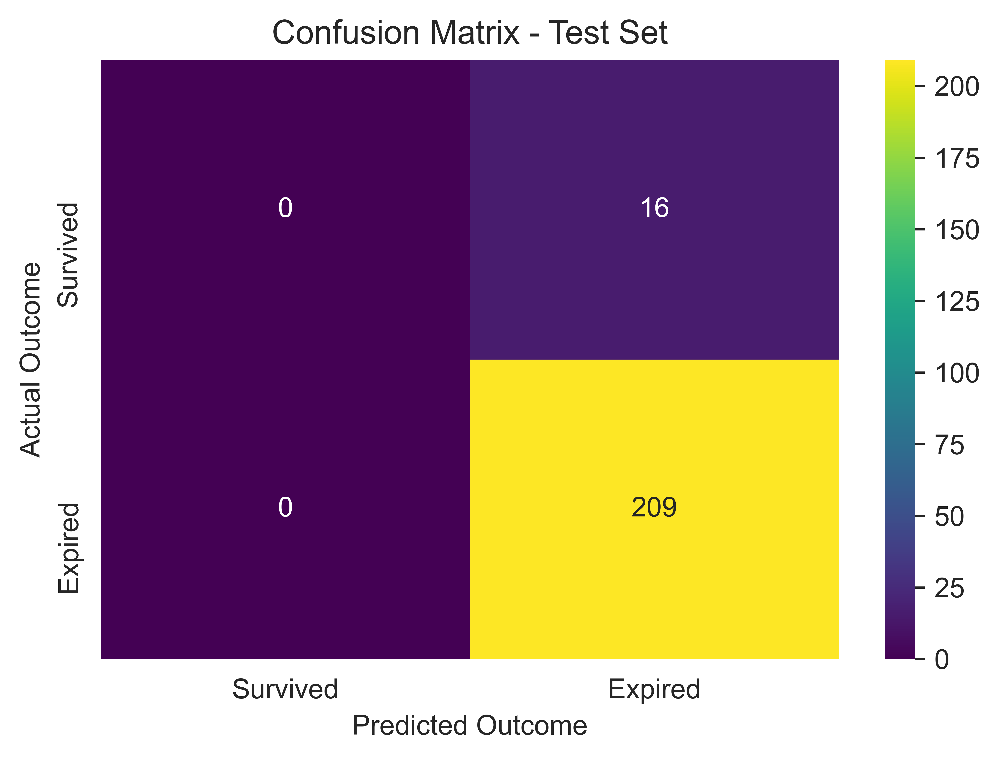

In [364]:
mpl.rcParams['figure.dpi'] = 1000
sns.set_style('darkgrid', {"axes.facecolor": ".9"})
sns.color_palette("viridis", as_cmap=True)
plot_confusion_matrix(y_test, y_test_pred, 'Test Set')

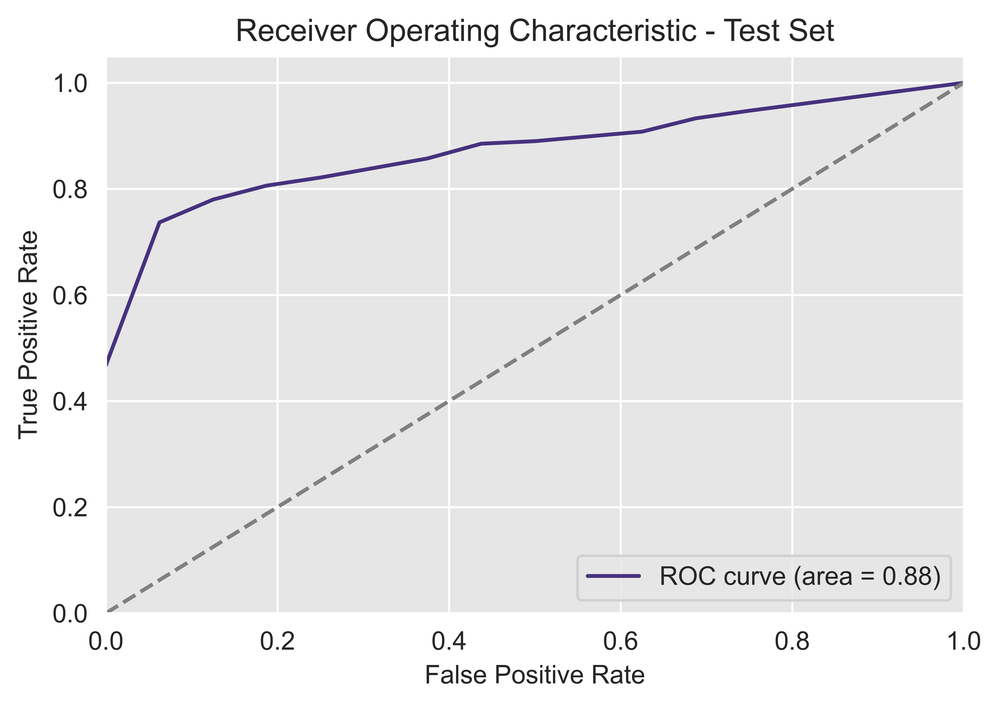

In [365]:
mpl.rcParams['figure.dpi'] = 1000
sns.set_style('darkgrid', {"axes.facecolor": ".9"})
sns.color_palette("viridis", as_cmap=True)
plot_roc_curve(y_test, y_test_proba, 'Test Set')

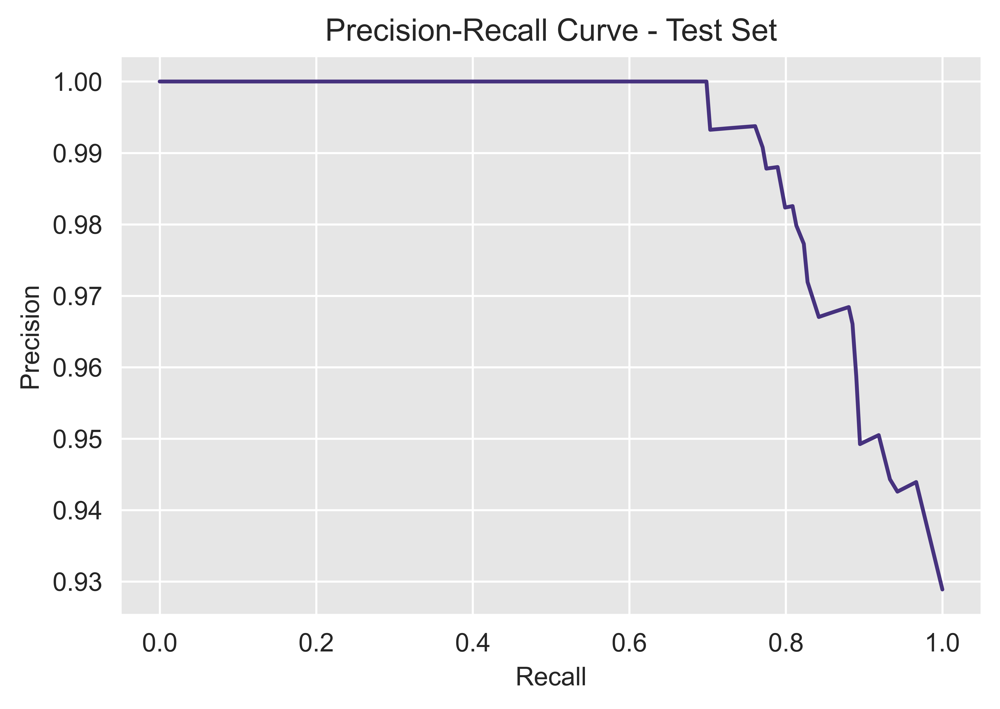

In [366]:
mpl.rcParams['figure.dpi'] = 1000
sns.set_style('darkgrid', {"axes.facecolor": ".9"})
sns.color_palette("viridis", as_cmap=True)
plot_precision_recall_curve(y_test, y_test_proba, 'Test Set')

## Create data splits

In [360]:
X_train, y_train, X_val, y_val, X_test, y_test = make_splits(TRAUMA_all_df, y_column='DECEASED')

## Perform machine learning while searching for best hyperparameters with XGB

In [376]:
model, y_train_pred, y_val_pred, y_test_pred, y_train_proba, y_val_proba, y_test_proba, roc_auc_val, roc_auc_test = GBM_classifier(alpha, X_train, y_train, X_val, y_val, X_test, y_test, XGBM=True, learning_rate=0, n_estimators=0)

Fitting 3 folds for each of 19683 candidates, totalling 59049 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    2.8s
[Parallel(n_jobs=-1)]: Done 174 tasks      | elapsed:    4.6s
[Parallel(n_jobs=-1)]: Done 580 tasks      | elapsed:    9.2s
[Parallel(n_jobs=-1)]: Done 1073 tasks      | elapsed:   16.4s
[Parallel(n_jobs=-1)]: Done 1563 tasks      | elapsed:   24.4s
[Parallel(n_jobs=-1)]: Done 2086 tasks      | elapsed:   34.4s
[Parallel(n_jobs=-1)]: Done 2969 tasks      | elapsed:   47.2s
[Parallel(n_jobs=-1)]: Done 3686 tasks      | elapsed:   59.5s
[Parallel(n_jobs=-1)]: Done 4375 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 5598 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 6449 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done 7851 tasks      | elapsed:  2.1min
[Parallel(n_jobs=-1)]: Done 8910 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done 10422 tasks      | elapsed:  2.8min
[Parallel(n_jobs=-1)]: Done 12060 tasks    

## Generate plots for analysis

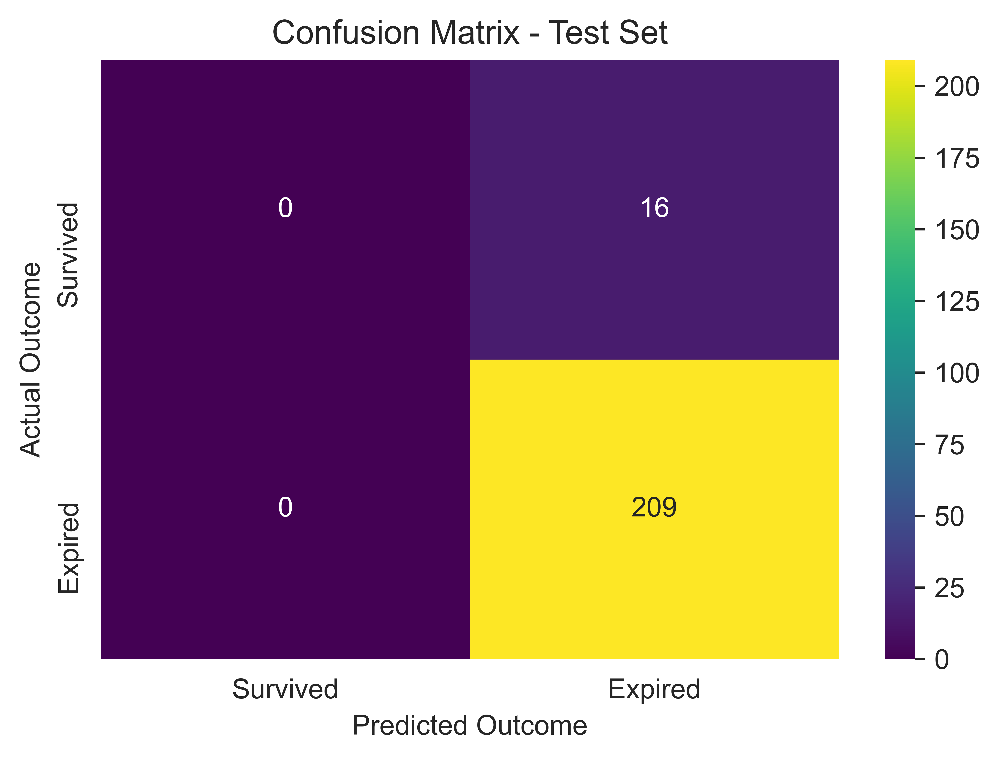

In [377]:
mpl.rcParams['figure.dpi'] = 1000
sns.set_style('darkgrid', {"axes.facecolor": ".9"})
sns.color_palette("viridis", as_cmap=True)
plot_confusion_matrix(y_test, y_test_pred, 'Test Set')

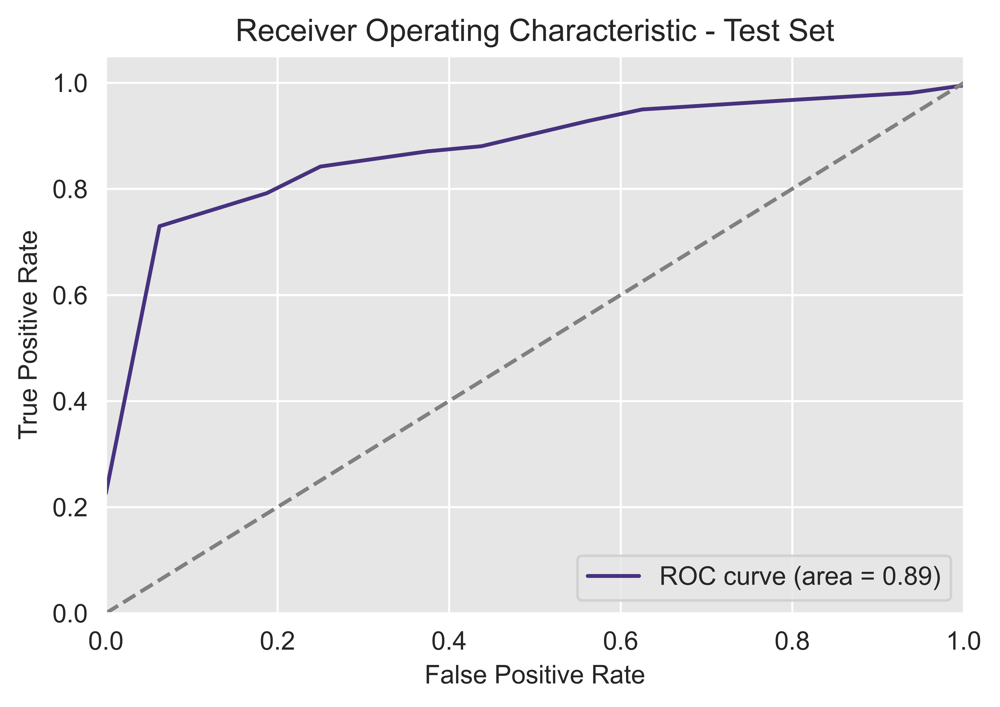

In [378]:
mpl.rcParams['figure.dpi'] = 1000
sns.set_style('darkgrid', {"axes.facecolor": ".9"})
sns.color_palette("viridis", as_cmap=True)
plot_roc_curve(y_test, y_test_proba, 'Test Set')

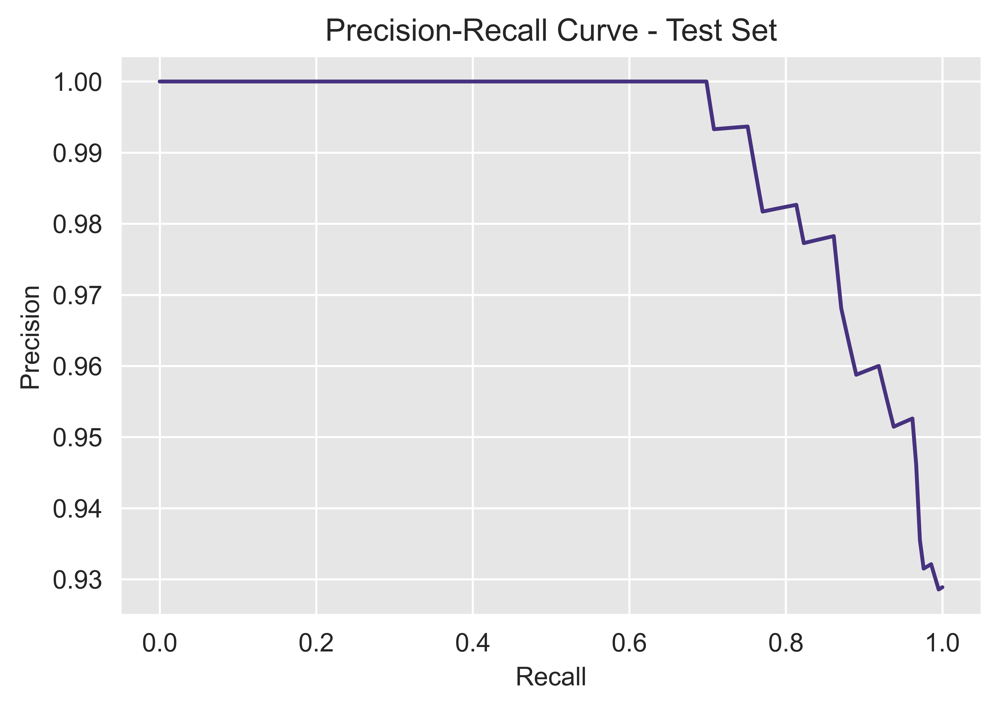

In [379]:
mpl.rcParams['figure.dpi'] = 1000
sns.set_style('darkgrid', {"axes.facecolor": ".9"})
sns.color_palette("viridis", as_cmap=True)
plot_precision_recall_curve(y_test, y_test_proba, 'Test Set')